# Generative Models PHW1

Name:

Student ID:

In [28]:
# Import necessary libraries
import networkx as nx
from matplotlib import pyplot as plt
import numpy as np
from collections import defaultdict
import scipy.io as sio

# Markov Random Field (10 points)

Consider a 2D image made of binary pixels. Now, suppose you have a noisy version of this image where each pixel has a 0.1 probability of flipping its value. In the figure below, a sample real and noisy image is displayed. In this problem, the goal is to recover the original image by observing the noisy image using a Markov random field.
The energy function of the network on this set of variables is defined as follows:
$$E=\alpha \sum_i  x_i  -\beta \sum_{i,j}x_{i}x_{j} -\gamma \sum_i x_i y_i$$

where the parameters need to be tuned. Based on the image provided in the file `HW1_image.mat`, you must find the real value of each pixel based on its noisy counterpart shown in the file.
To do this, find the optimal value for the above energy function. First, initialize the real pixel values (i.e., $x_i$) with their noisy values given in the file. Then, sequentially check if assigning the value +1 or -1 to each pixel decreases the energy function. Repeat this process until the energy function converges.
- Display the recovered image and report the numeric value of your accuracy.
- Discuss the effect of increasing or decreasing each of the three model parameters and for one of the parameters, demonstrate this effect by changing it and recovering the image again.
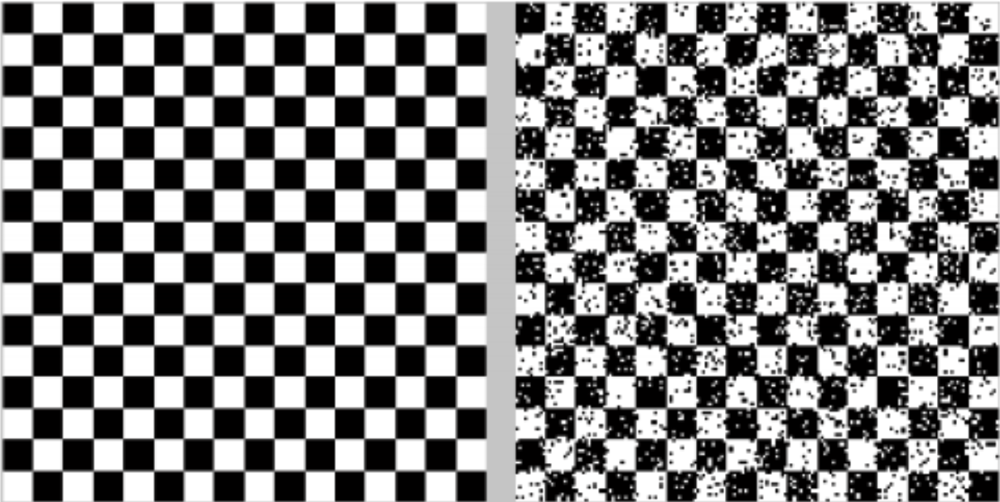

In [107]:
class MarkovRandomFieldDenoising:
    def __init__(self, image_file, alpha, beta, gamma):
        self.load_data(image_file)
        self.initialize_parameters(alpha, beta, gamma)

    def load_data(self, image_file):
        # TODO: Load the noisy image data from the provided file
        data = sio.loadmat(image_file)
        self.noisy_image = data['noisy_image'].astype(np.int32)
        self.true_image = data['original_image'].astype(np.int32)

    def initialize_parameters(self, alpha, beta, gamma):
        # TODO: Initialize the parameters for the Markov random field
        self.alpha = alpha
        self.beta = beta
        self.gamma = gamma

        self.energy_function(self.true_image)

    def energy_function(self, image):
        # TODO: Implement the energy function
        energy = 0
        image = np.where(image == 0, -1, image)

        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                # Add energy computation based on neighbors
                current_pxl = image[i, j]
                neighbor_sum = self.neighbor_energy(image, i, j)
                energy += current_pxl * (self.alpha - self.beta * neighbor_sum - self.gamma * self.noisy_image[i][j])

        return energy

    def neighbor_energy(self, image, i, j):

        neighbor_sum = 0
        if i > 0:
            neighbor_sum += image[i - 1, j]
        if i < image.shape[0] - 1:
            neighbor_sum += image[i + 1, j]
        if j > 0:
            neighbor_sum += image[i, j - 1]
        if j < image.shape[1] - 1:
            neighbor_sum += image[i, j + 1]

        return neighbor_sum

    def update_energy(self, image, i, j, energy):
        pxl = image[i, j]
        conv = True
        neighbor_sum = self.neighbor_energy(image, i, j)
        local_energy = pxl * (self.alpha - self.beta * neighbor_sum - self.gamma * self.noisy_image[i][j])
        # print(local_energy)
        if local_energy > 0:
            energy -= 2 * local_energy
            pxl *= -1
            conv = False
        return energy, pxl, conv

    def denoise_image(self):
        # TODO: Implement the denoising algorithm
        denoised_image = self.noisy_image.copy()
        denoised_image = np.where(denoised_image == 0, -1, denoised_image)

        energy = self.energy_function(denoised_image)
        converged = False
        iterations = 0
        while not converged and iterations < 100:
            converged = True
            for i in range(denoised_image.shape[0]):
                for j in range(denoised_image.shape[1]):
                    # Check if flipping the pixel reduces the energy

                    energy, pxl, converged = self.update_energy(denoised_image, i, j, energy)
                    denoised_image[i, j] = pxl

            # iterations += 1

        denoised_image = np.where(denoised_image != 1, 0, denoised_image)
        return denoised_image.astype(np.uint8)

    def compute_accuracy(self, denoised_image):
        # TODO: Compute the accuracy of the denoised image
        accuracy = np.mean(denoised_image == self.true_image)
        return accuracy

    def plot_images(self, denoised_image):
        # TODO: Plot the noisy, true, and denoised images
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 3, 1)
        plt.title('Noisy Image')
        plt.imshow(self.noisy_image, cmap='gray')
        plt.subplot(1, 3, 2)
        plt.title('True Image')
        plt.imshow(self.true_image, cmap='gray')
        plt.subplot(1, 3, 3)
        plt.title('Denoised Image')
        plt.imshow(denoised_image, cmap='gray')
        plt.show()


In [110]:
def run(alpha, beta, gamma):
    print('alpha, beta, gamma', alpha, beta, gamma)
    mrf_denoising = MarkovRandomFieldDenoising('HW1_image.mat', alpha, beta, gamma)
    # Denoise the image
    denoised_image = mrf_denoising.denoise_image()

    # Compute the accuracy
    accuracy = mrf_denoising.compute_accuracy(denoised_image)
    print(f"Accuracy: {accuracy}")

    # Plot the images
    mrf_denoising.plot_images(denoised_image)


alpha, beta, gamma 0.01 0.01 0.01
Accuracy: 0.9797265625


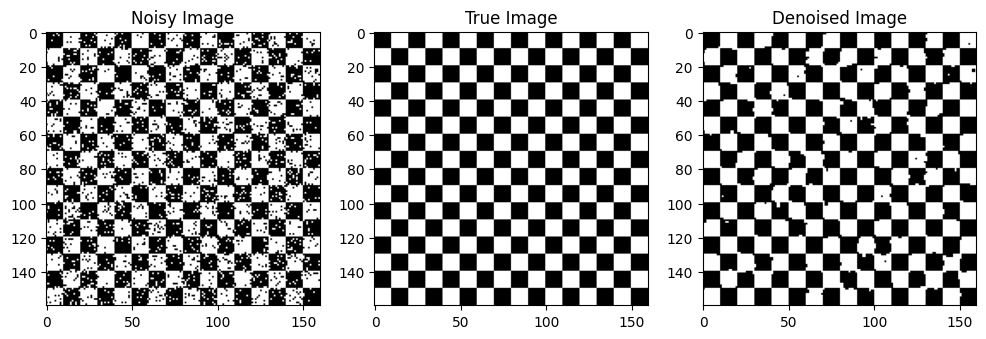

alpha, beta, gamma 0.01 0.01 0.1
Accuracy: 0.937265625


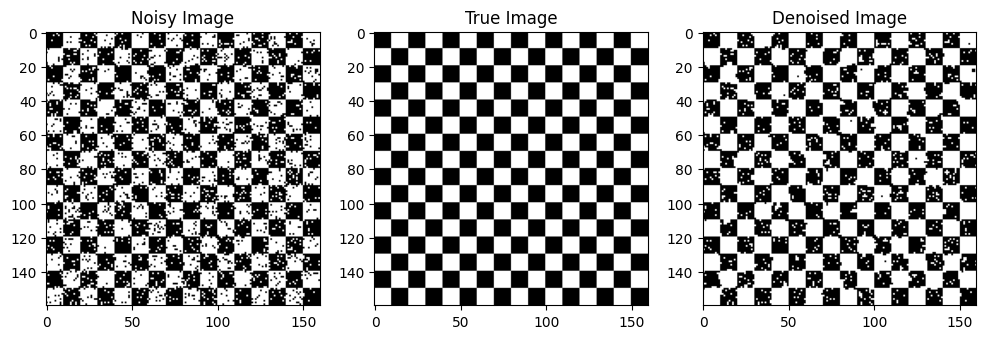

alpha, beta, gamma 0.01 0.01 1
Accuracy: 0.937265625


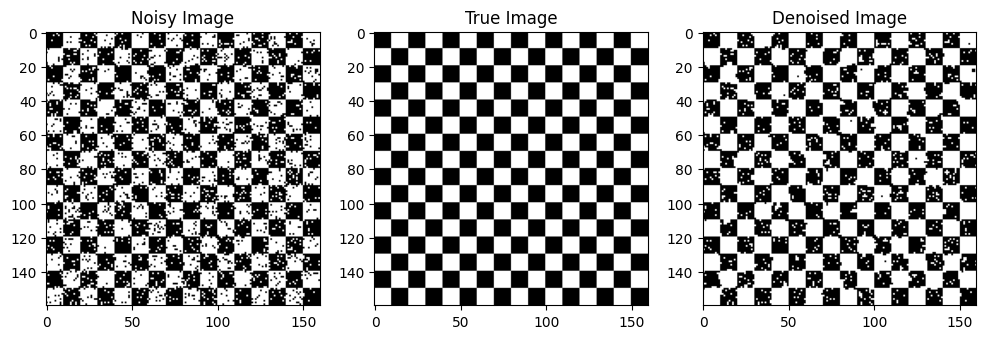

alpha, beta, gamma 0.01 0.01 10
Accuracy: 0.937265625


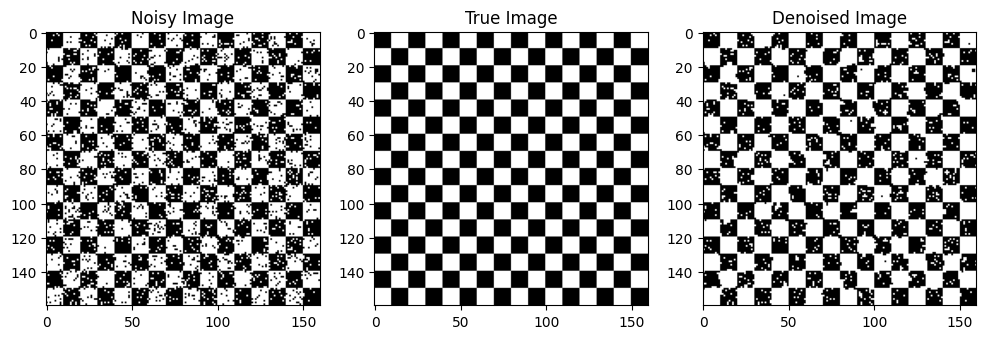

alpha, beta, gamma 0.01 0.01 100
Accuracy: 0.937265625


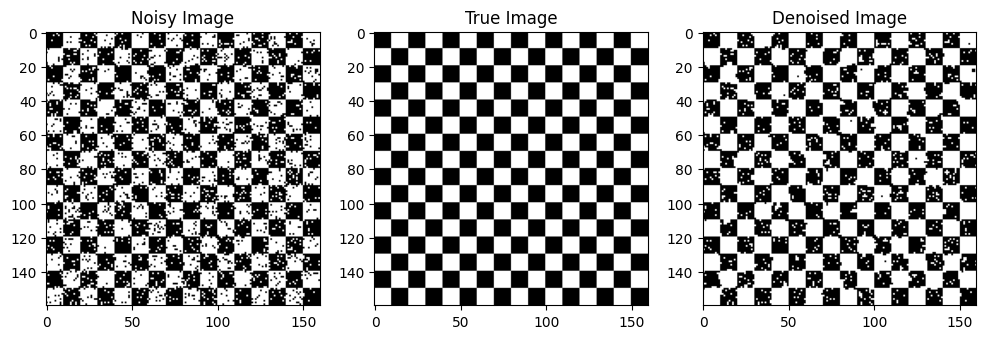

alpha, beta, gamma 0.01 0.1 0.01
Accuracy: 0.9799609375


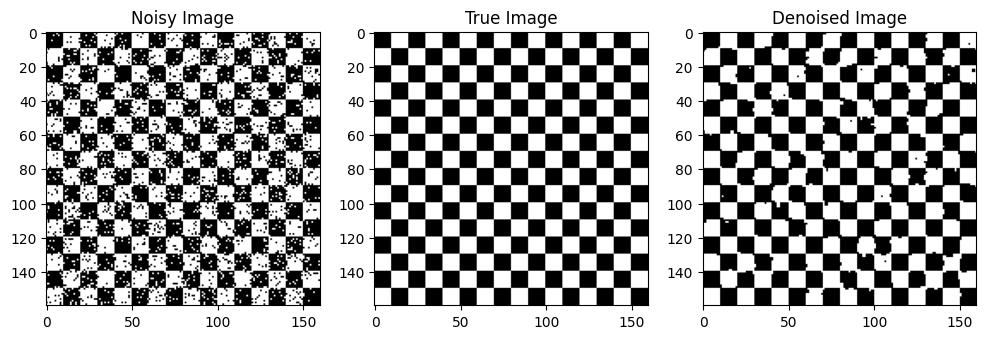

alpha, beta, gamma 0.01 0.1 0.1
Accuracy: 0.9799609375


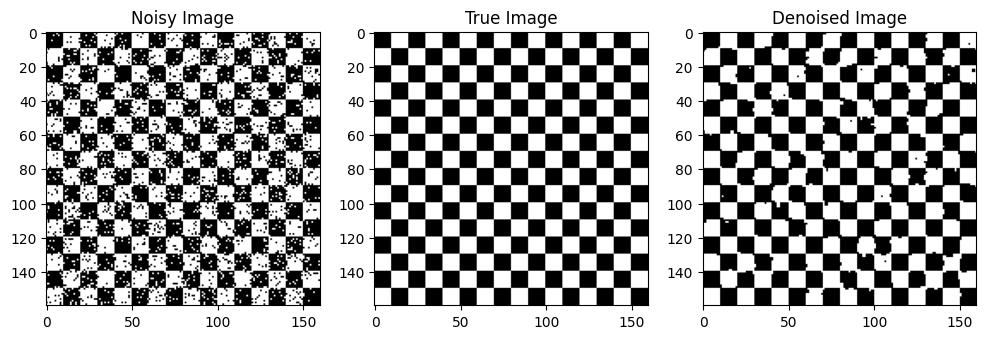

alpha, beta, gamma 0.01 0.1 1
Accuracy: 0.9371875


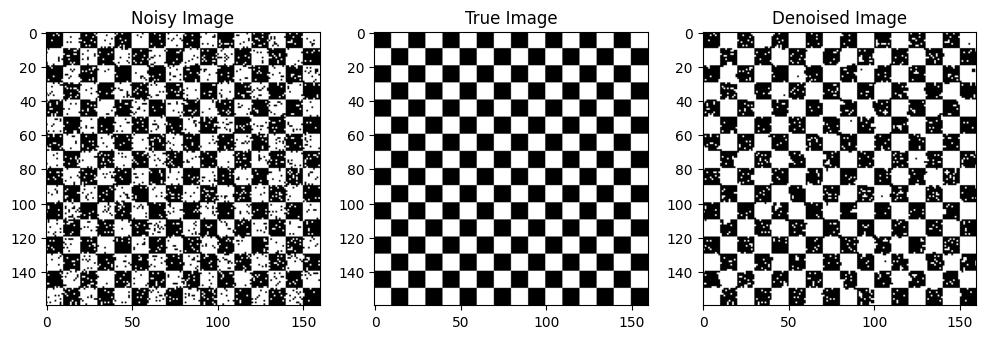

alpha, beta, gamma 0.01 0.1 10
Accuracy: 0.9371875


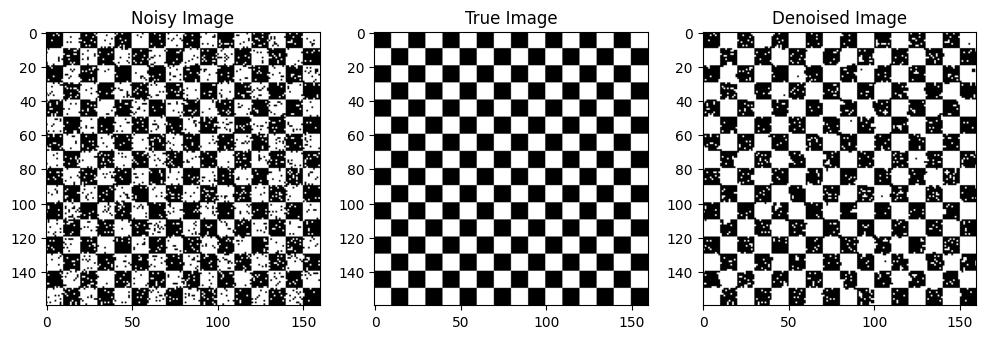

alpha, beta, gamma 0.01 0.1 100
Accuracy: 0.9371875


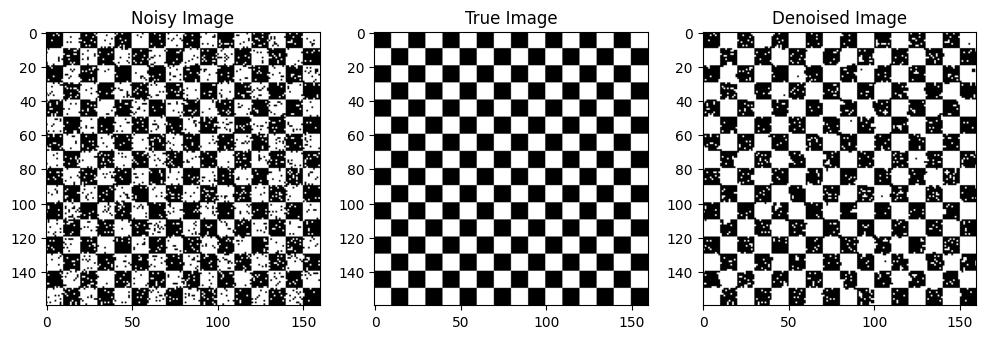

alpha, beta, gamma 0.01 1 0.01
Accuracy: 0.9799609375


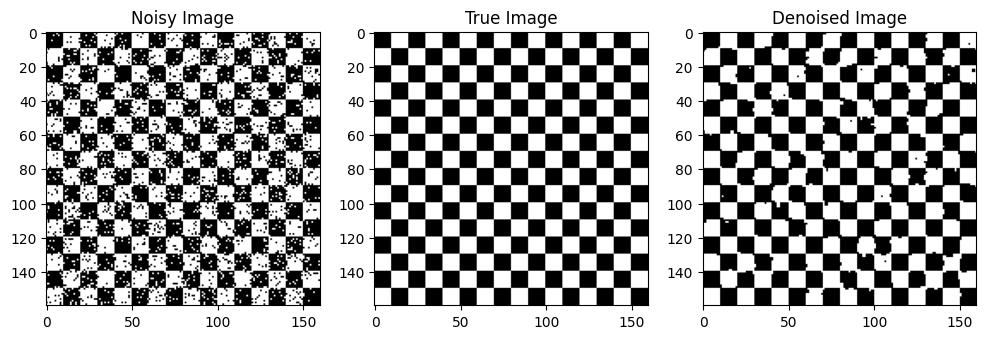

alpha, beta, gamma 0.01 1 0.1
Accuracy: 0.9799609375


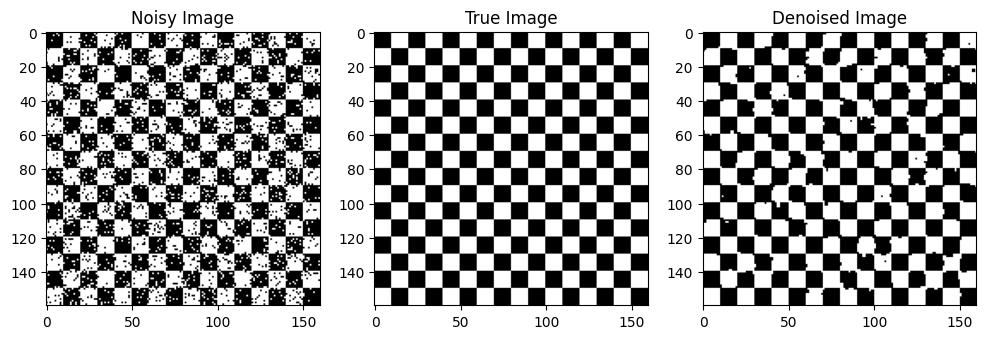

alpha, beta, gamma 0.01 1 1
Accuracy: 0.9799609375


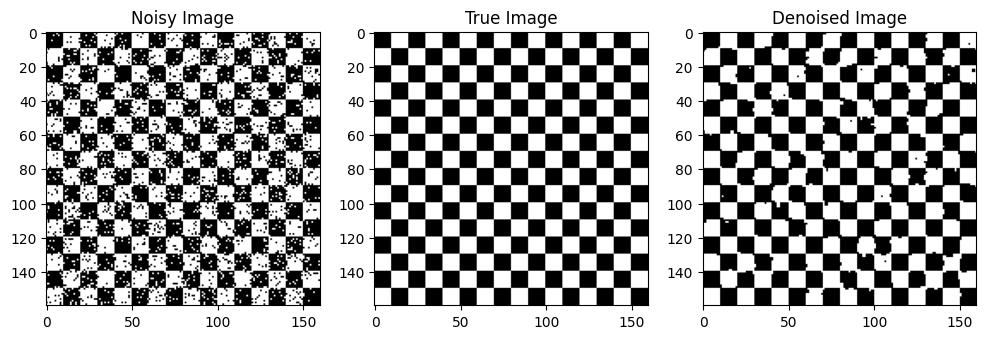

alpha, beta, gamma 0.01 1 10
Accuracy: 0.9371875


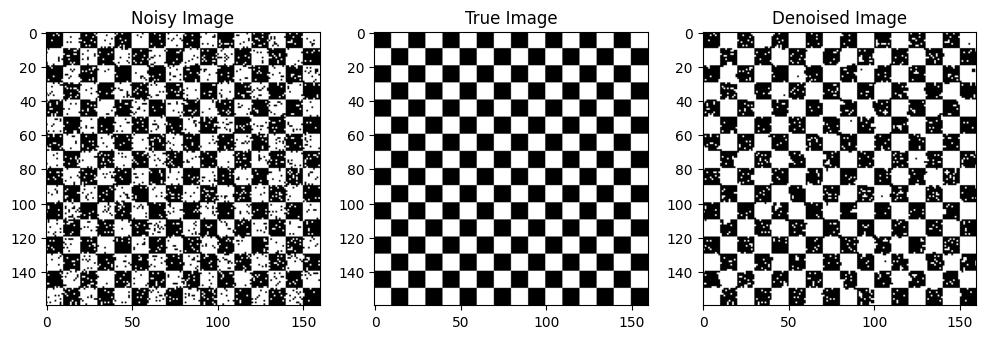

alpha, beta, gamma 0.01 1 100
Accuracy: 0.9371875


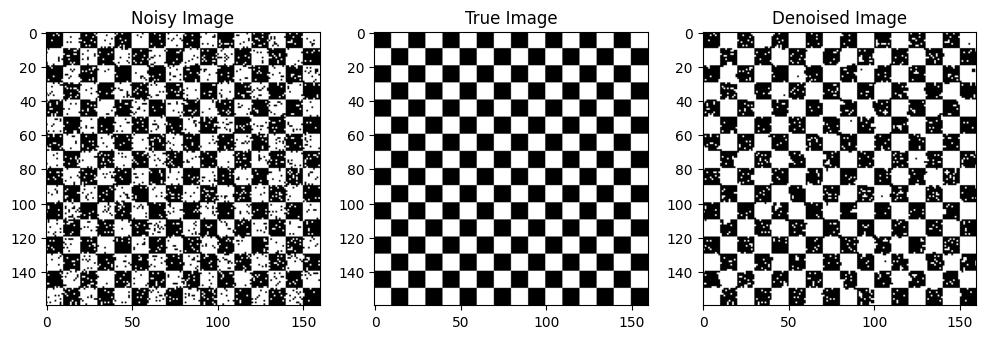

alpha, beta, gamma 0.01 10 0.01
Accuracy: 0.9799609375


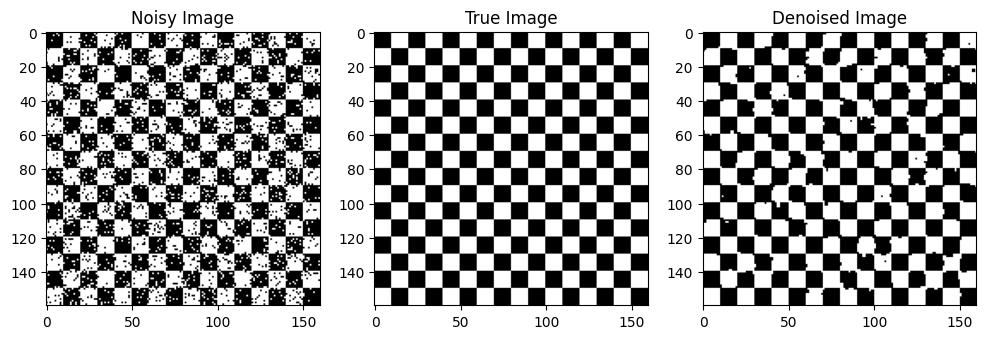

alpha, beta, gamma 0.01 10 0.1
Accuracy: 0.9799609375


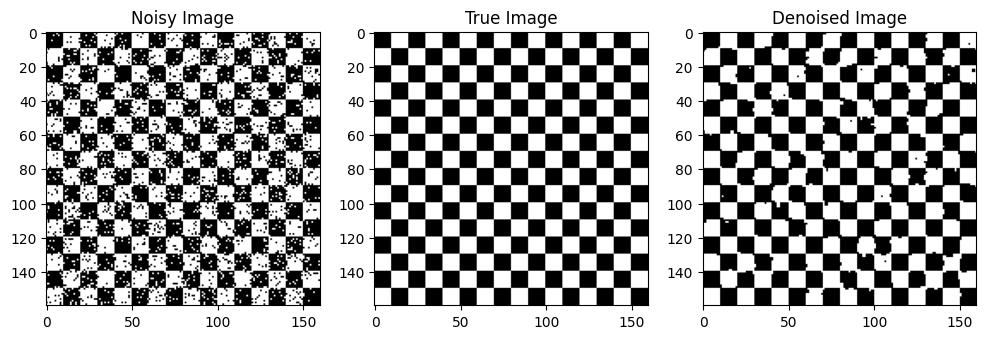

alpha, beta, gamma 0.01 10 1
Accuracy: 0.9799609375


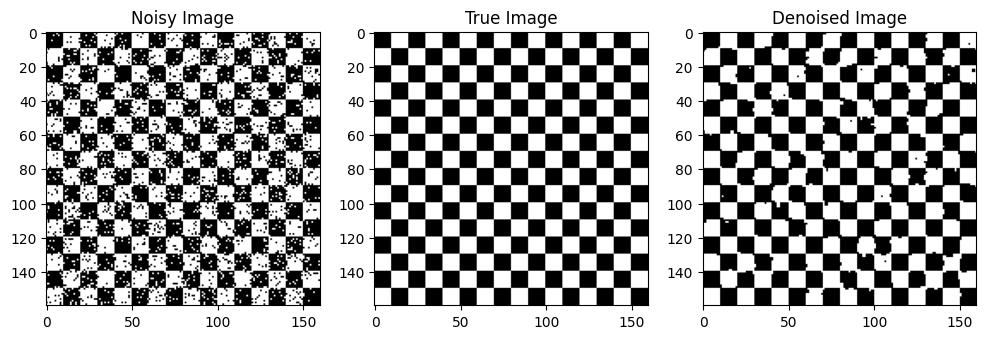

alpha, beta, gamma 0.01 10 10
Accuracy: 0.9799609375


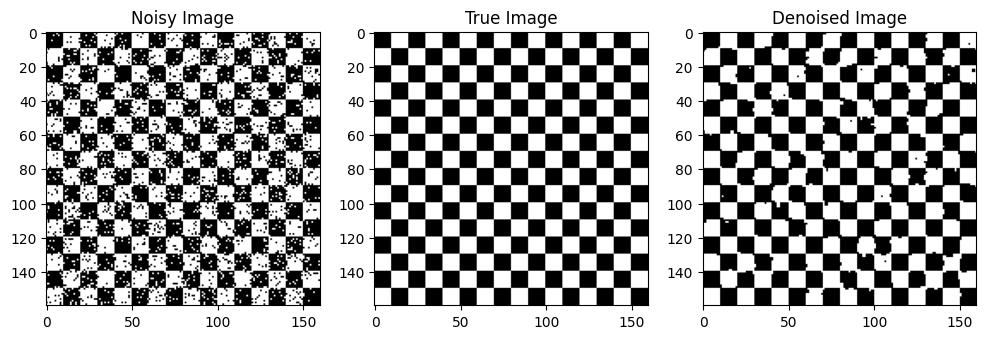

alpha, beta, gamma 0.01 10 100
Accuracy: 0.9371875


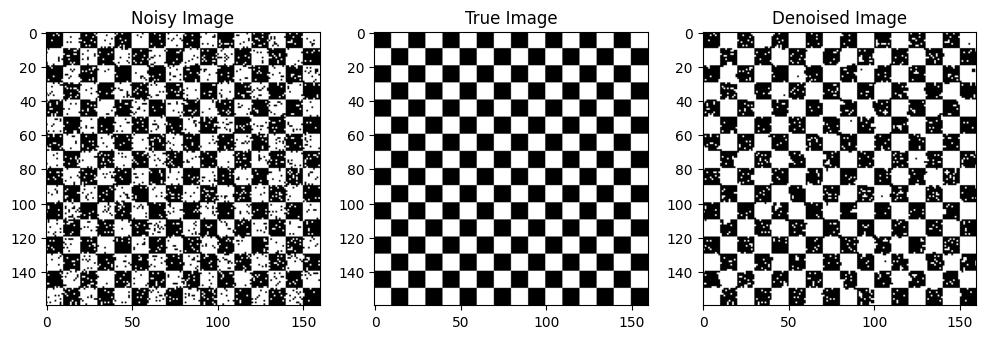

alpha, beta, gamma 0.01 100 0.01
Accuracy: 0.9799609375


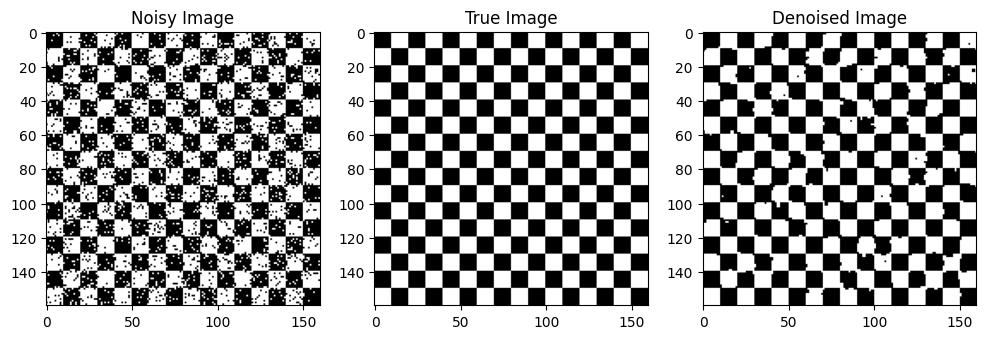

alpha, beta, gamma 0.01 100 0.1
Accuracy: 0.9799609375


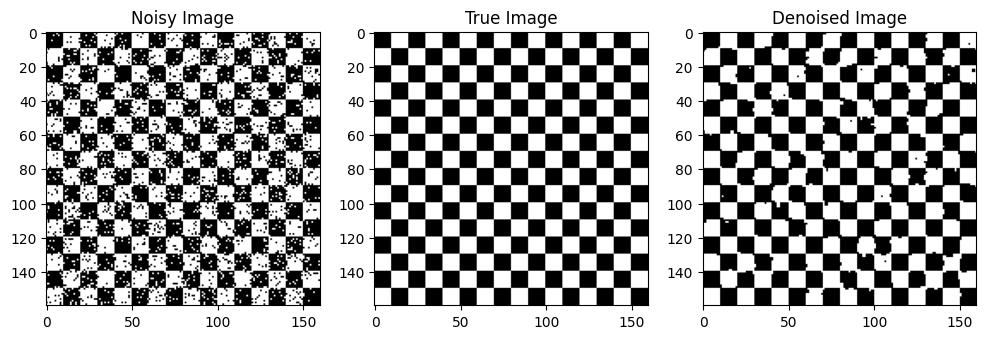

alpha, beta, gamma 0.01 100 1
Accuracy: 0.9799609375


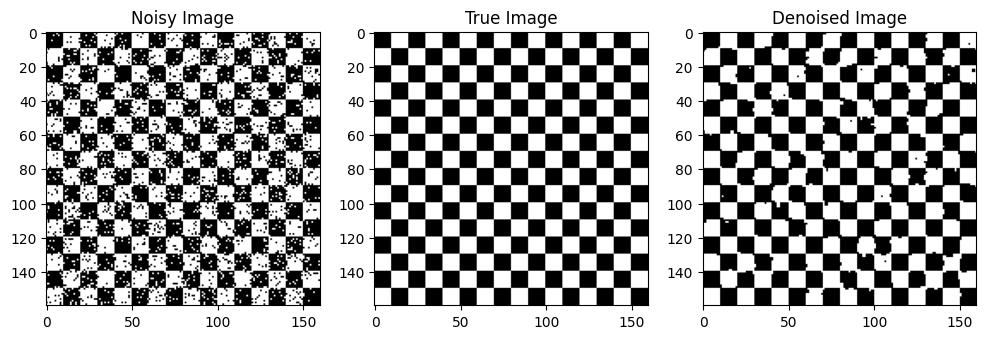

alpha, beta, gamma 0.01 100 10
Accuracy: 0.9799609375


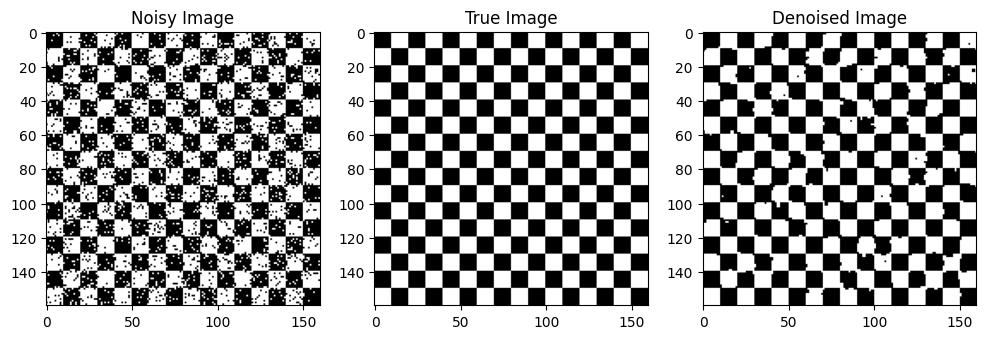

alpha, beta, gamma 0.01 100 100
Accuracy: 0.9799609375


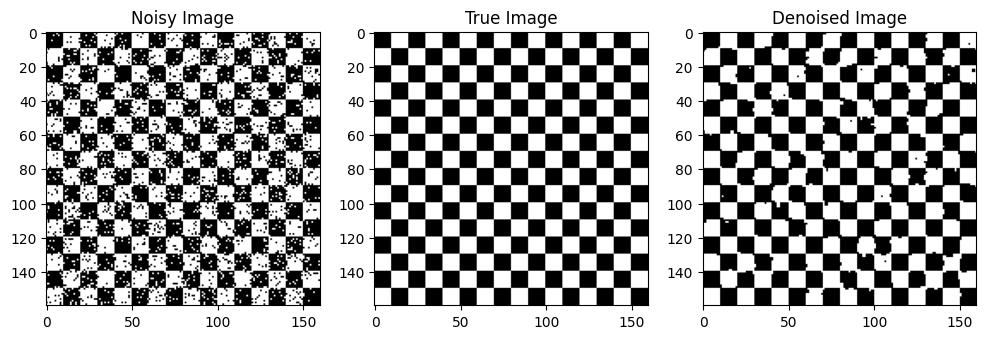

alpha, beta, gamma 0.1 0.01 0.01
Accuracy: 0.5


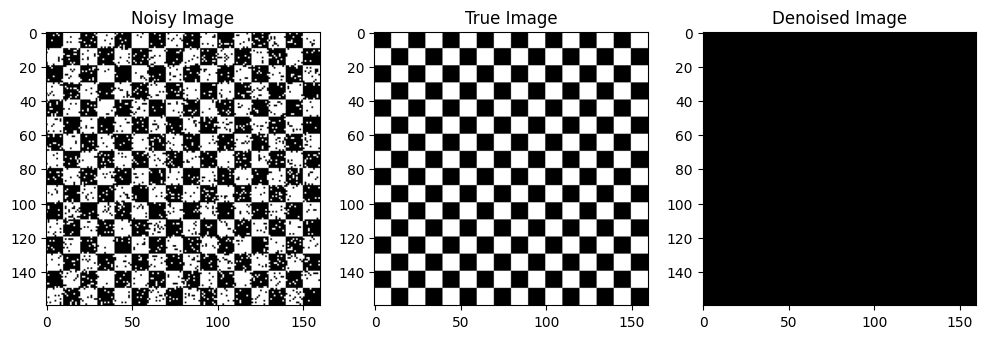

alpha, beta, gamma 0.1 0.01 0.1
Accuracy: 0.9385546875


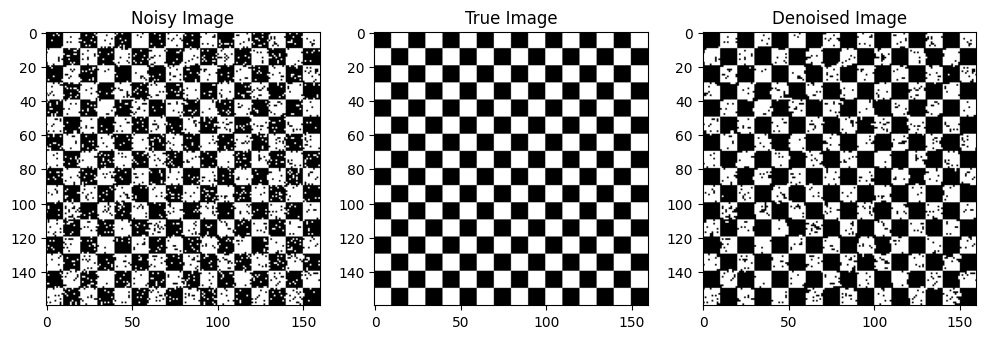

alpha, beta, gamma 0.1 0.01 1
Accuracy: 0.901875


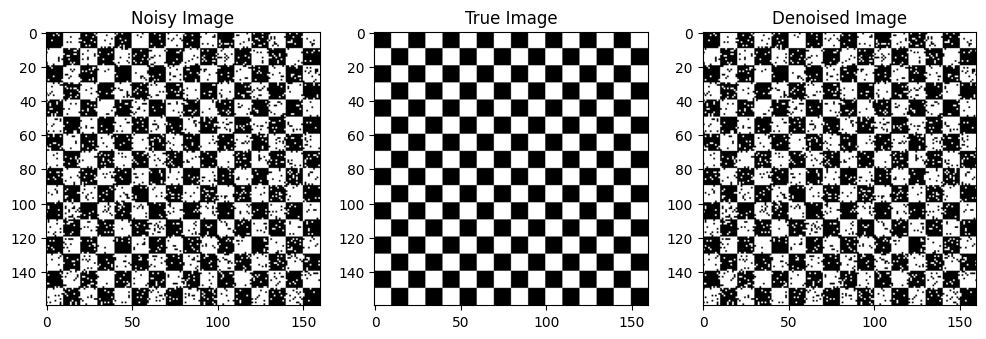

alpha, beta, gamma 0.1 0.01 10
Accuracy: 0.901875


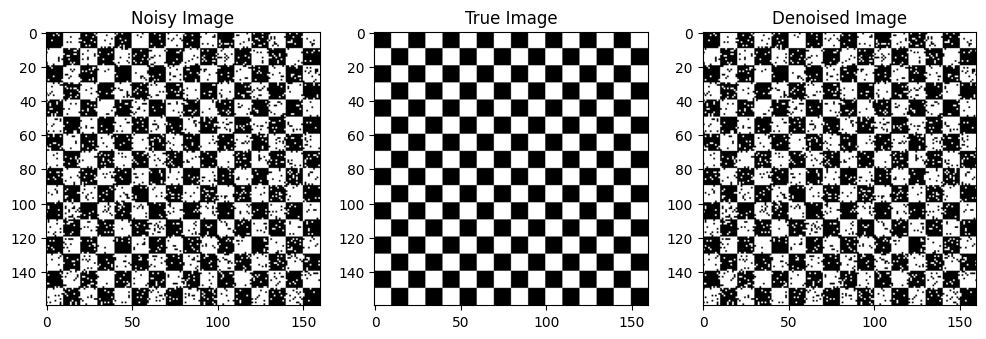

alpha, beta, gamma 0.1 0.01 100
Accuracy: 0.901875


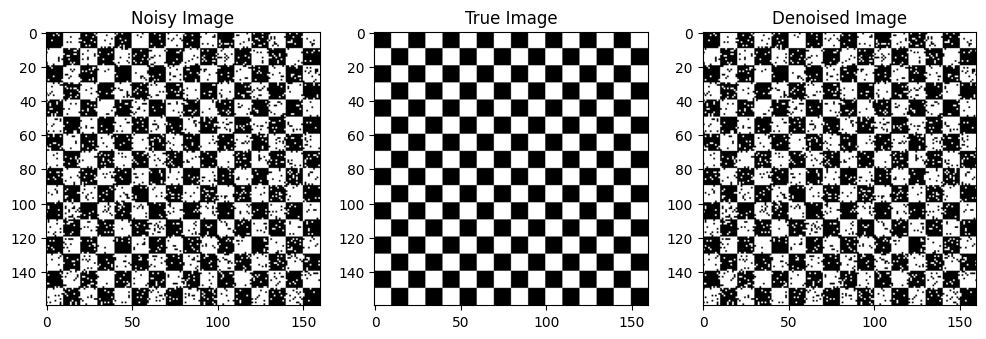

alpha, beta, gamma 0.1 0.1 0.01
Accuracy: 0.5453125


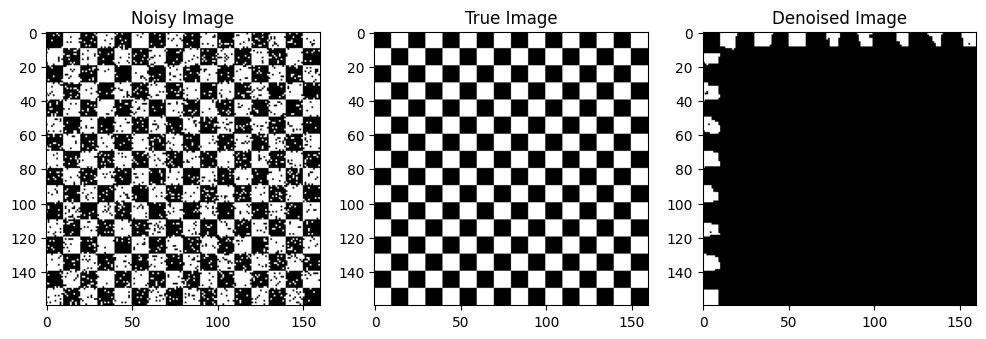

alpha, beta, gamma 0.1 0.1 0.1
Accuracy: 0.9797265625


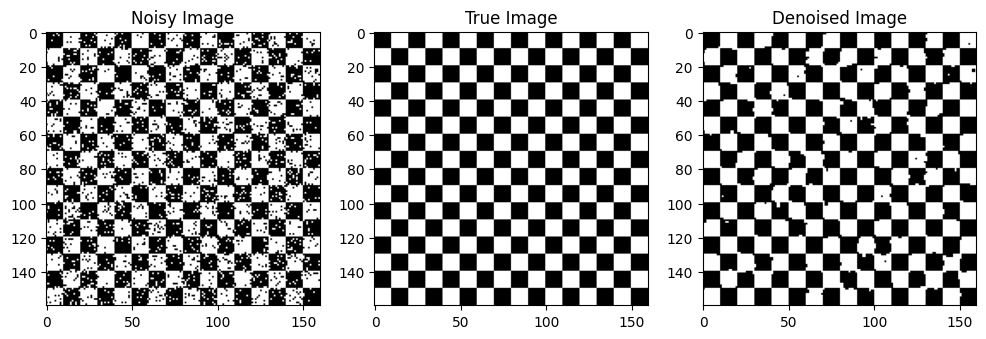

alpha, beta, gamma 0.1 0.1 1
Accuracy: 0.937265625


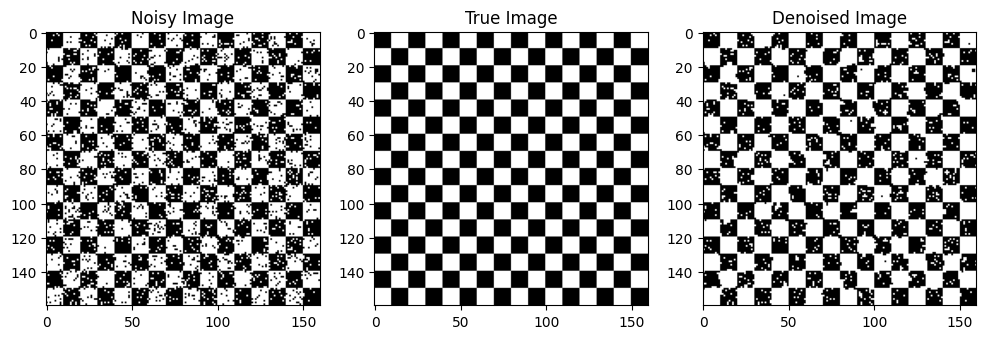

alpha, beta, gamma 0.1 0.1 10
Accuracy: 0.937265625


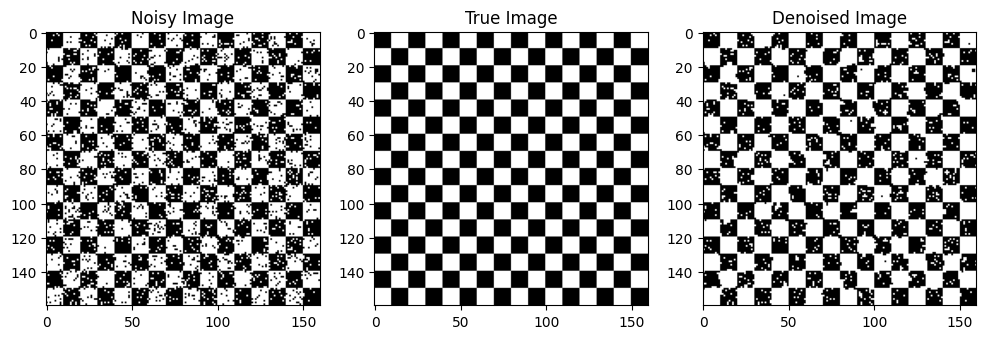

alpha, beta, gamma 0.1 0.1 100
Accuracy: 0.937265625


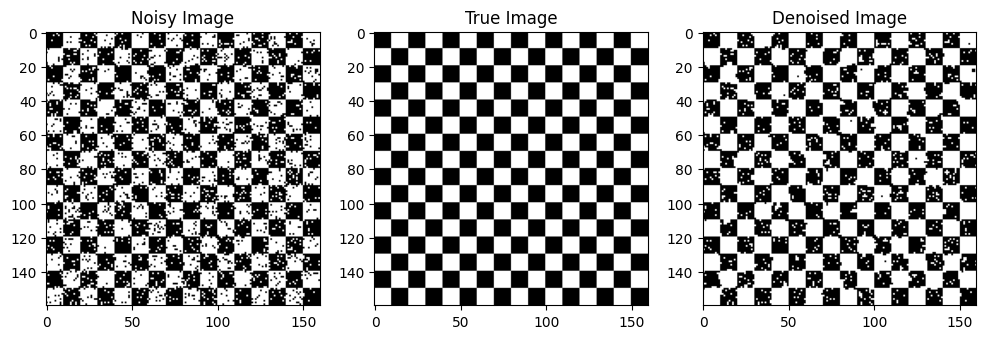

alpha, beta, gamma 0.1 1 0.01
Accuracy: 0.5467578125


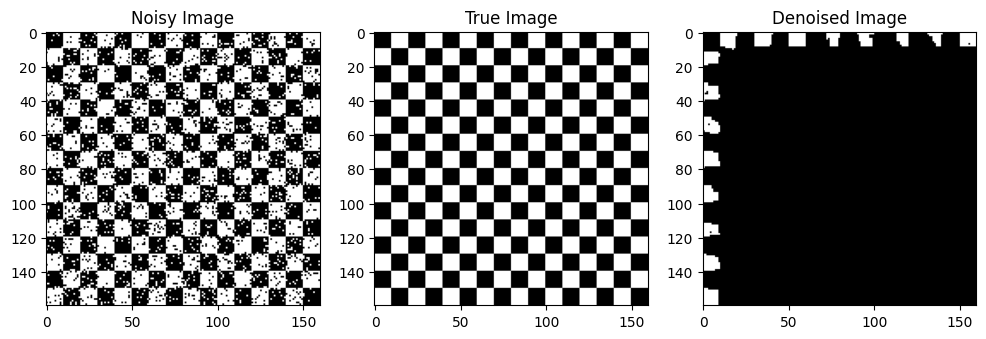

alpha, beta, gamma 0.1 1 0.1
Accuracy: 0.9799609375


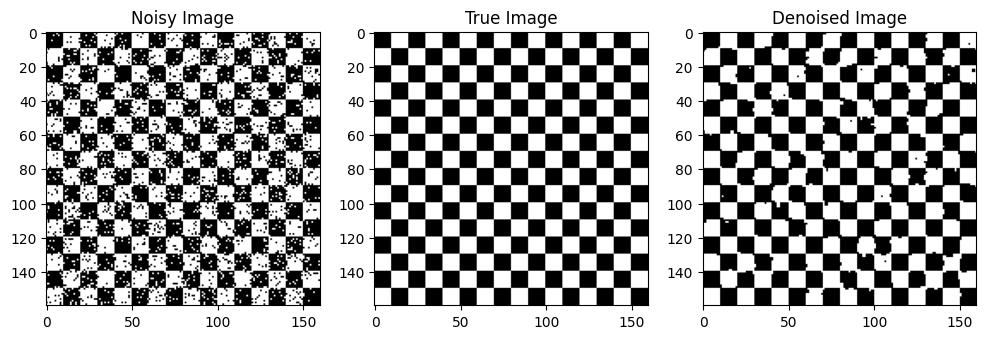

alpha, beta, gamma 0.1 1 1
Accuracy: 0.9799609375


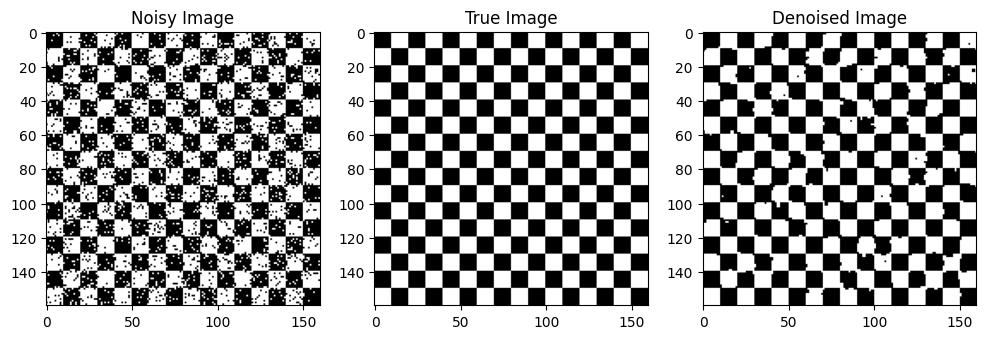

alpha, beta, gamma 0.1 1 10
Accuracy: 0.9371875


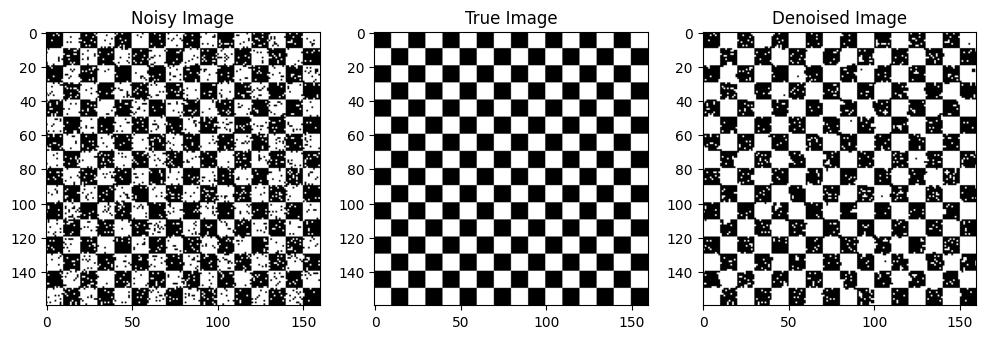

alpha, beta, gamma 0.1 1 100
Accuracy: 0.9371875


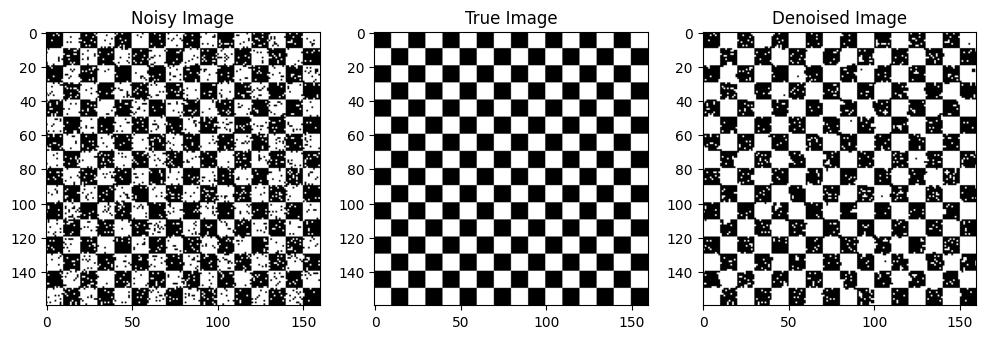

alpha, beta, gamma 0.1 10 0.01
Accuracy: 0.5467578125


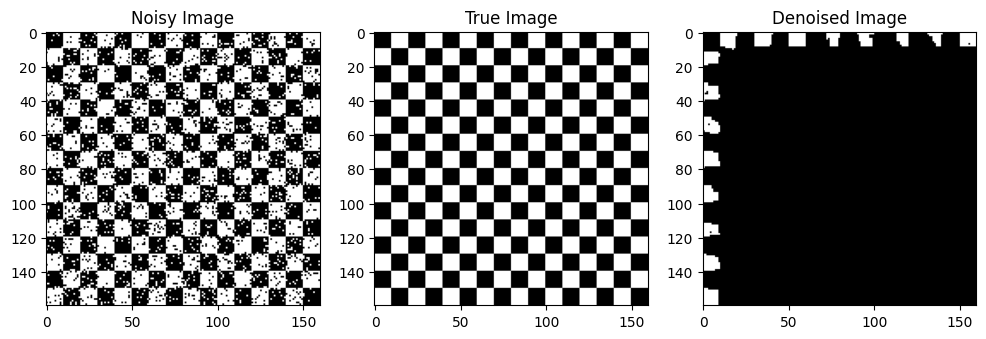

alpha, beta, gamma 0.1 10 0.1
Accuracy: 0.9799609375


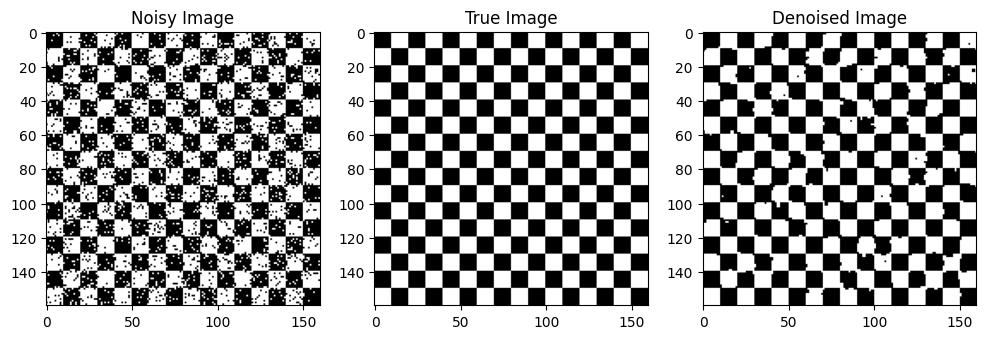

alpha, beta, gamma 0.1 10 1
Accuracy: 0.9799609375


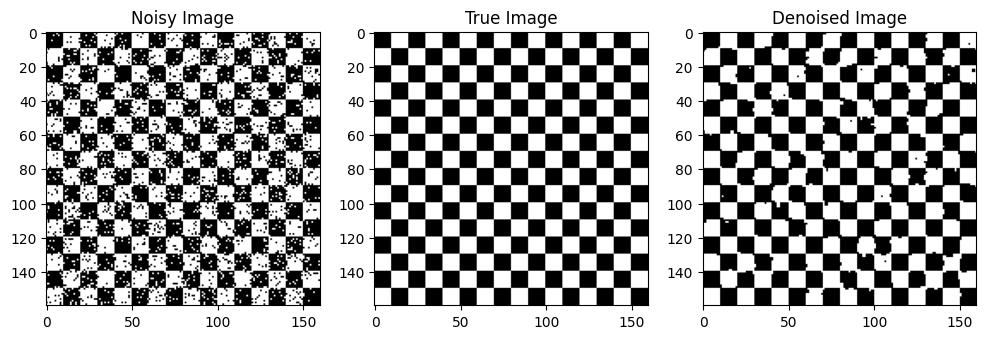

alpha, beta, gamma 0.1 10 10
Accuracy: 0.9799609375


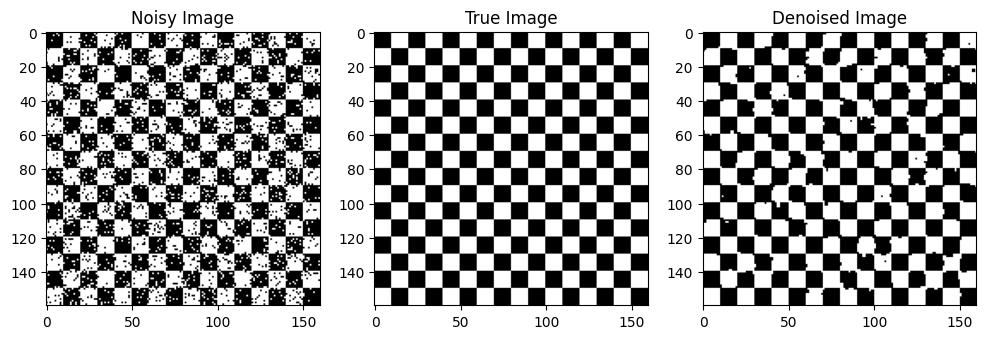

alpha, beta, gamma 0.1 10 100
Accuracy: 0.9371875


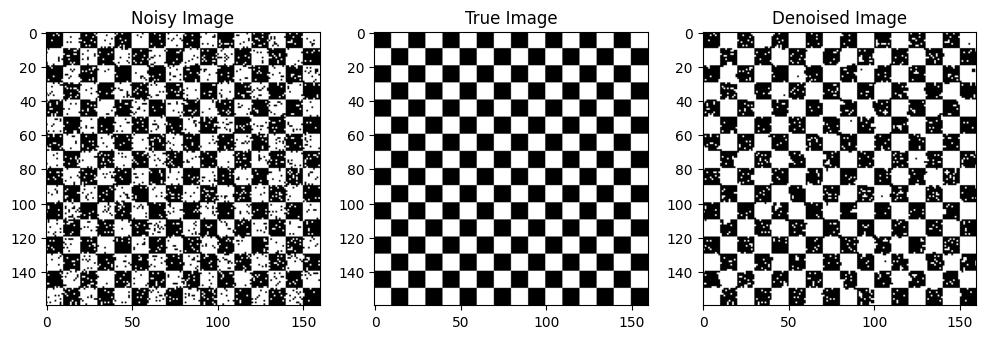

alpha, beta, gamma 0.1 100 0.01
Accuracy: 0.5467578125


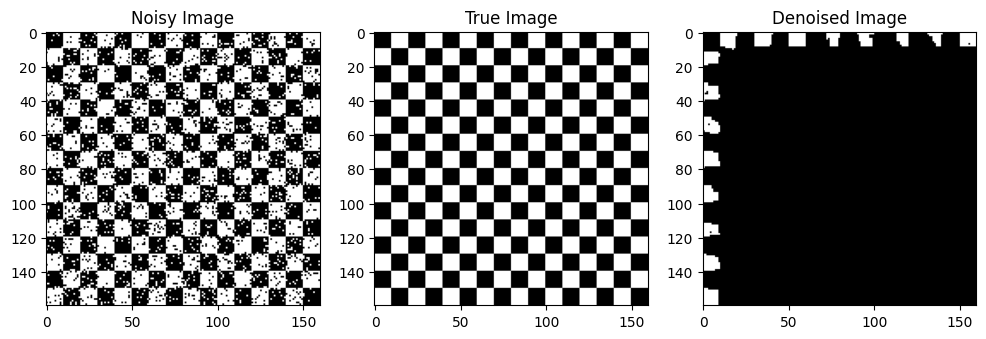

alpha, beta, gamma 0.1 100 0.1
Accuracy: 0.9799609375


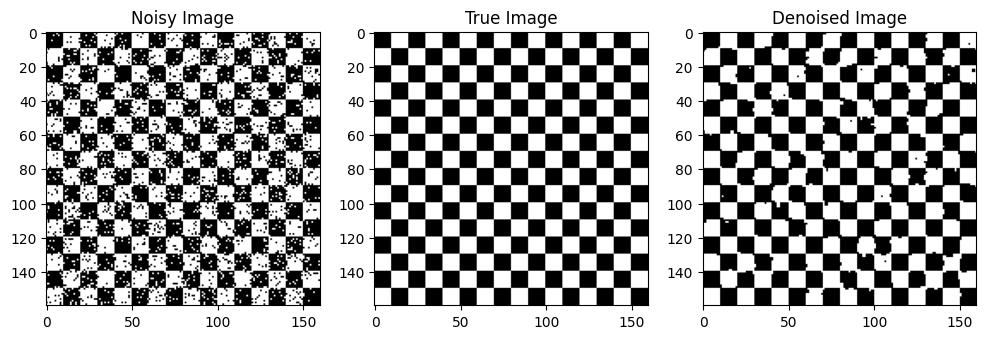

alpha, beta, gamma 0.1 100 1
Accuracy: 0.9799609375


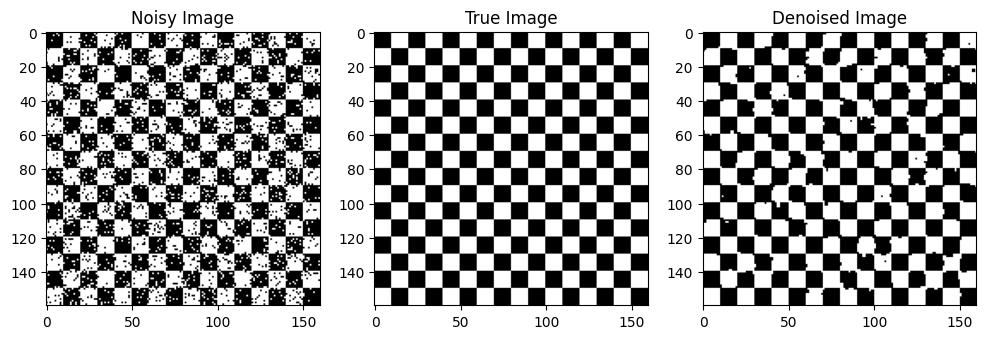

alpha, beta, gamma 0.1 100 10
Accuracy: 0.9799609375


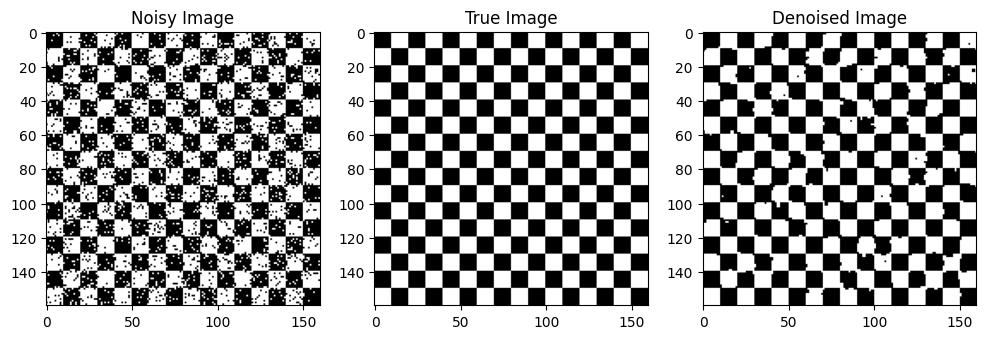

alpha, beta, gamma 0.1 100 100
Accuracy: 0.9799609375


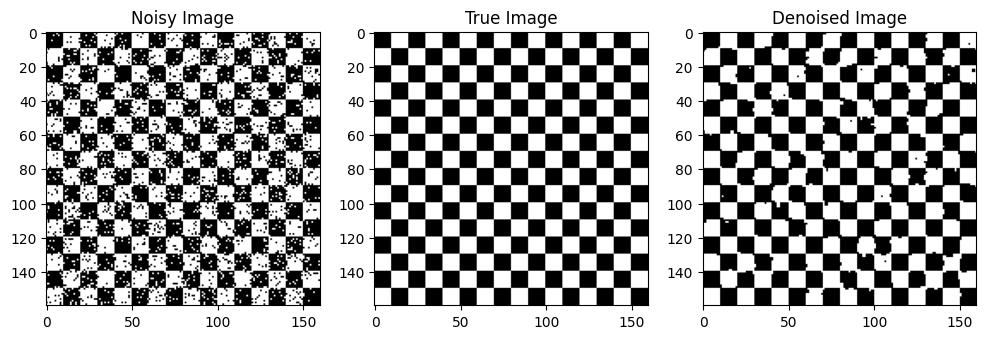

alpha, beta, gamma 1 0.01 0.01
Accuracy: 0.5


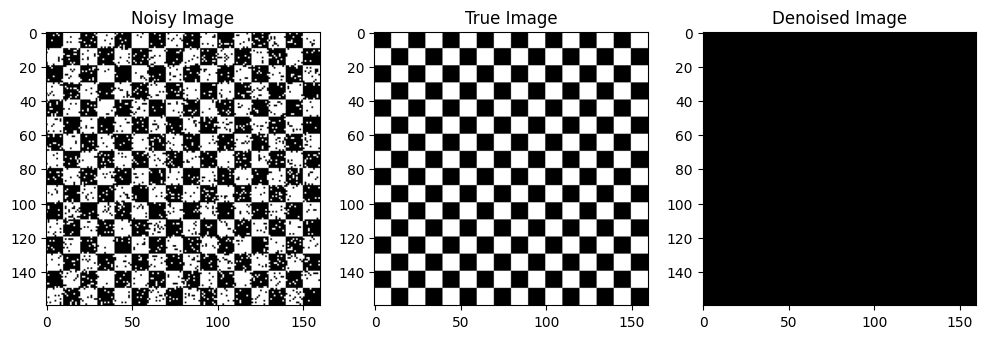

alpha, beta, gamma 1 0.01 0.1
Accuracy: 0.5


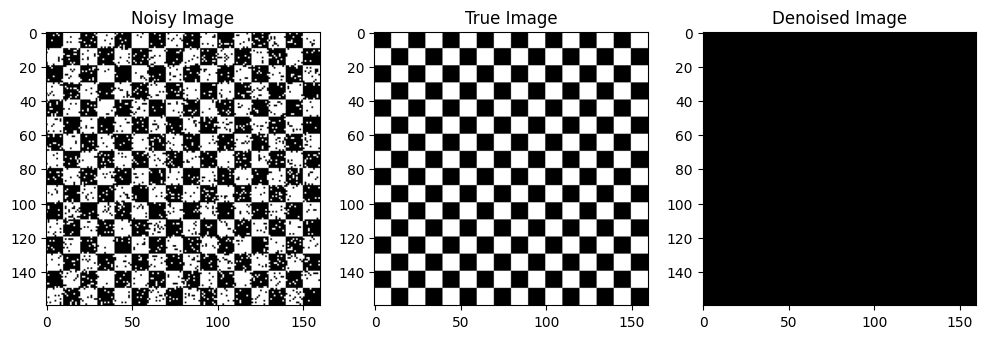

alpha, beta, gamma 1 0.01 1
Accuracy: 0.9385546875


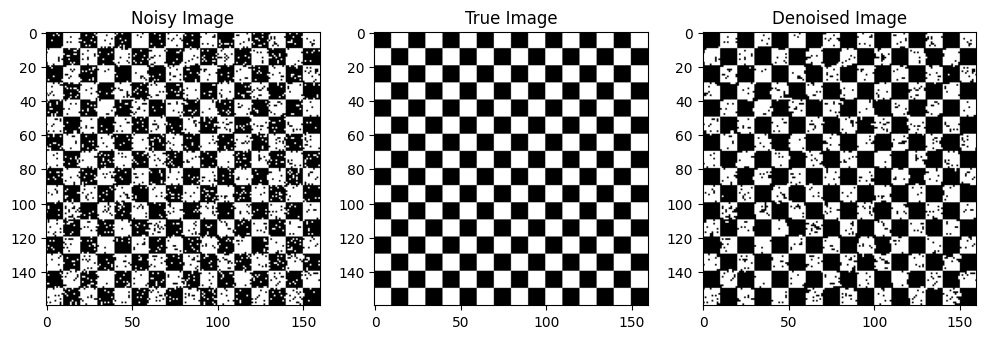

alpha, beta, gamma 1 0.01 10
Accuracy: 0.901875


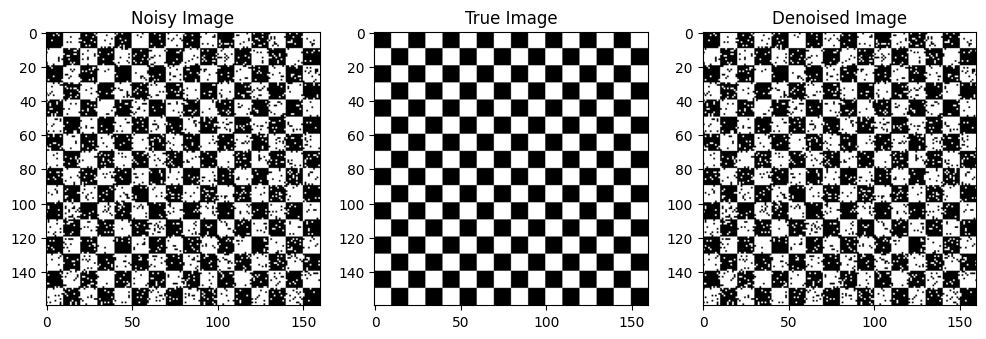

alpha, beta, gamma 1 0.01 100
Accuracy: 0.901875


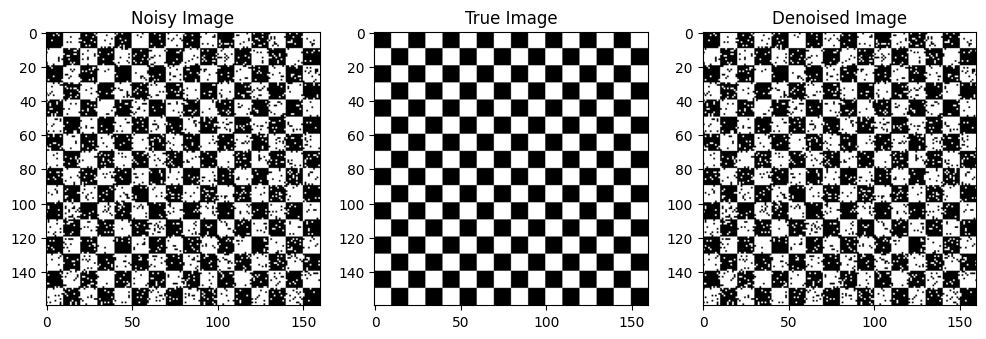

alpha, beta, gamma 1 0.1 0.01
Accuracy: 0.5


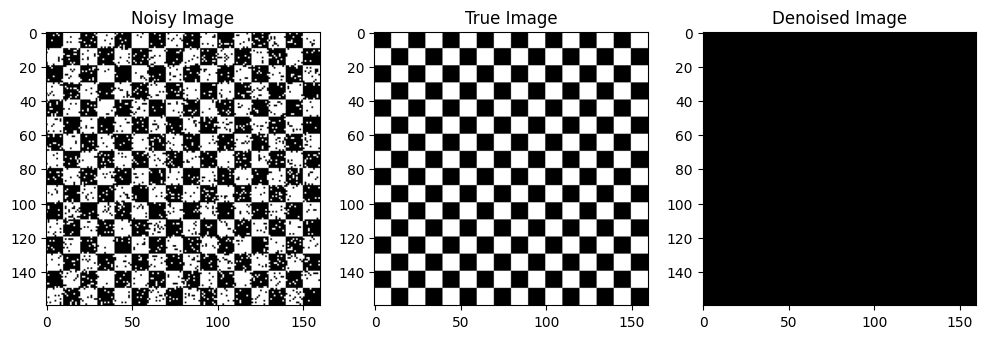

alpha, beta, gamma 1 0.1 0.1
Accuracy: 0.5


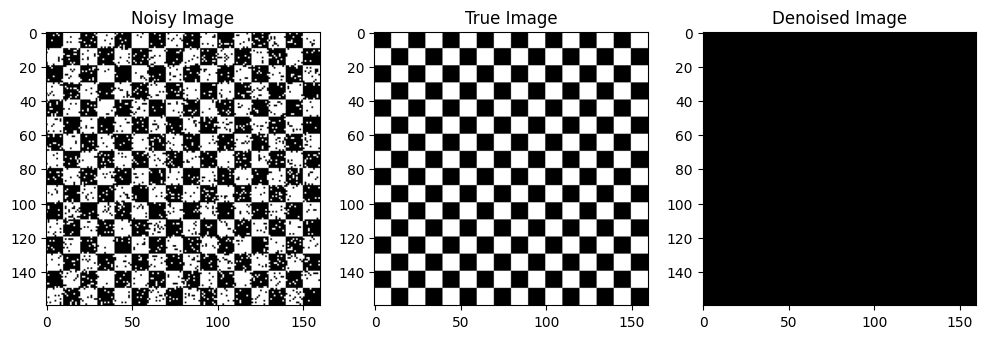

alpha, beta, gamma 1 0.1 1
Accuracy: 0.9385546875


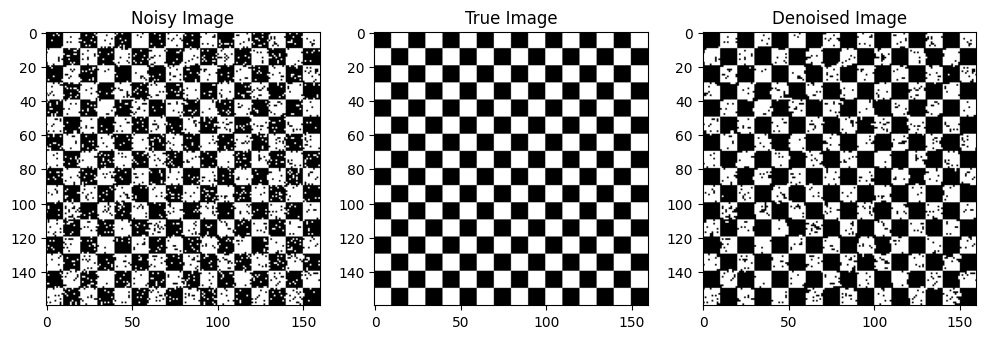

alpha, beta, gamma 1 0.1 10
Accuracy: 0.901875


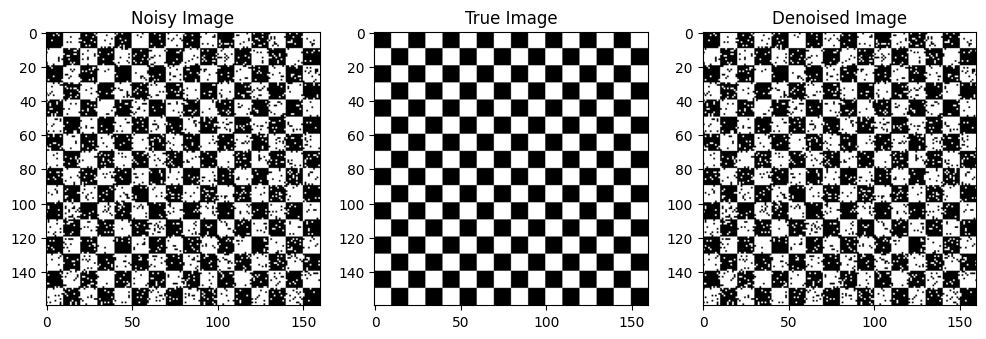

alpha, beta, gamma 1 0.1 100
Accuracy: 0.901875


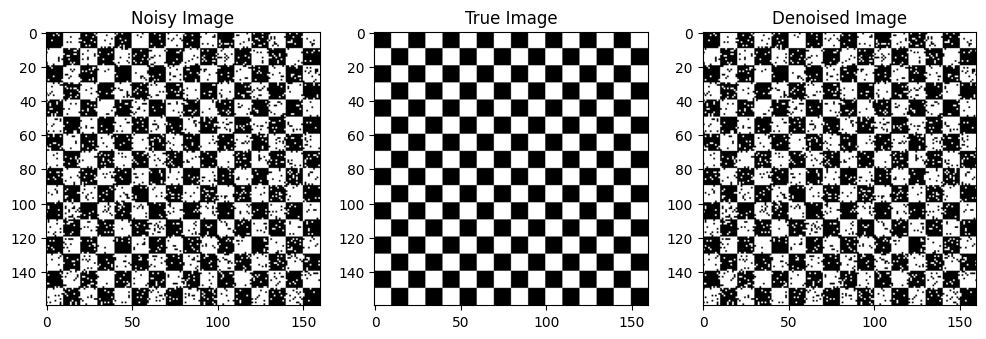

alpha, beta, gamma 1 1 0.01
Accuracy: 0.5453125


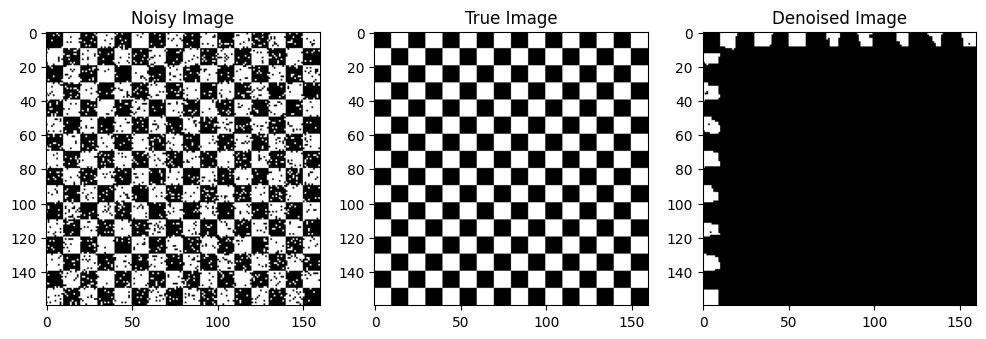

alpha, beta, gamma 1 1 0.1
Accuracy: 0.5453125


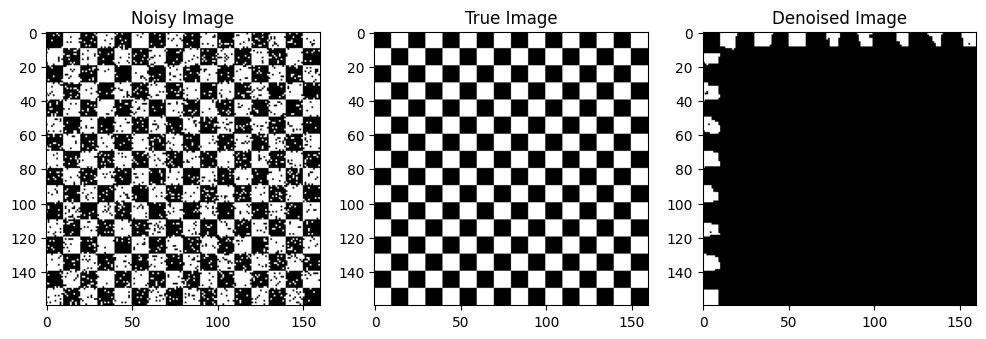

alpha, beta, gamma 1 1 1
Accuracy: 0.9797265625


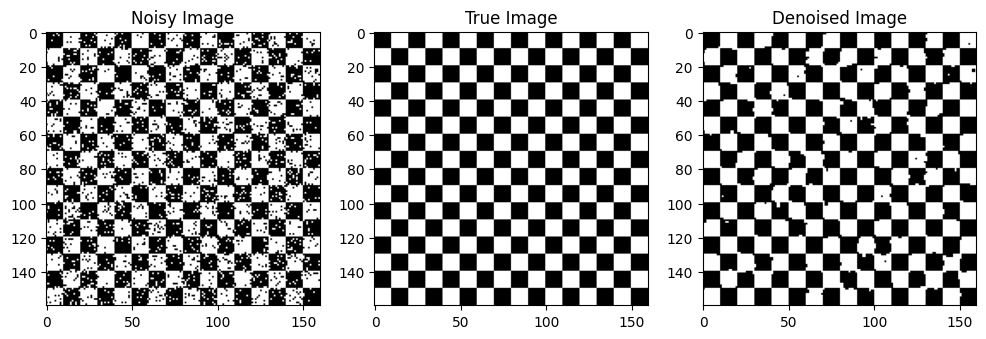

alpha, beta, gamma 1 1 10
Accuracy: 0.937265625


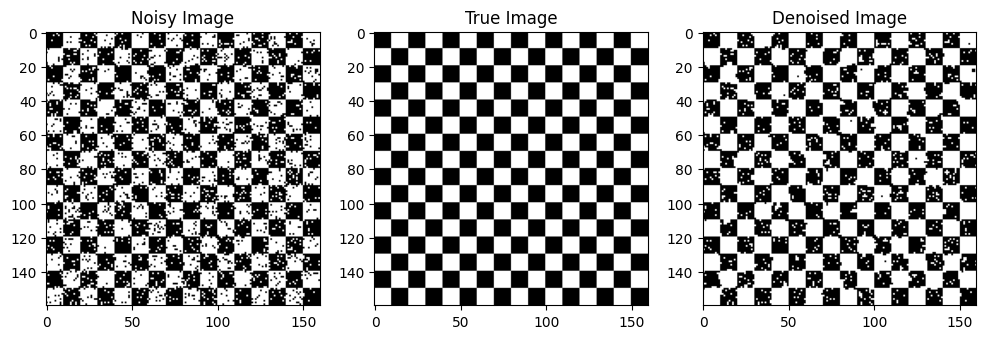

alpha, beta, gamma 1 1 100
Accuracy: 0.937265625


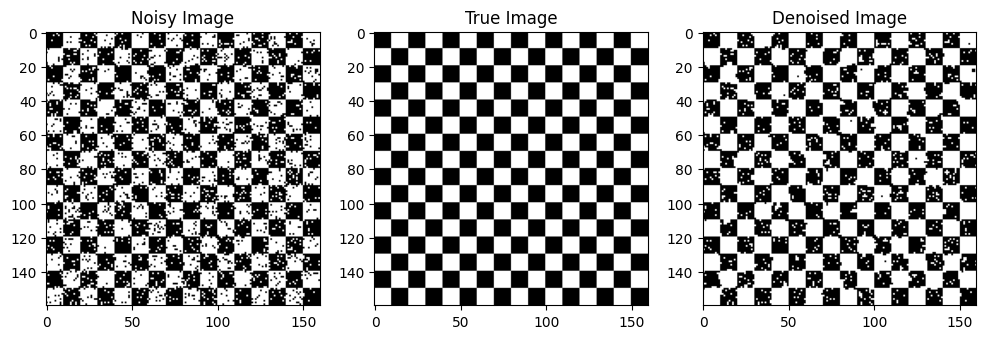

alpha, beta, gamma 1 10 0.01
Accuracy: 0.5467578125


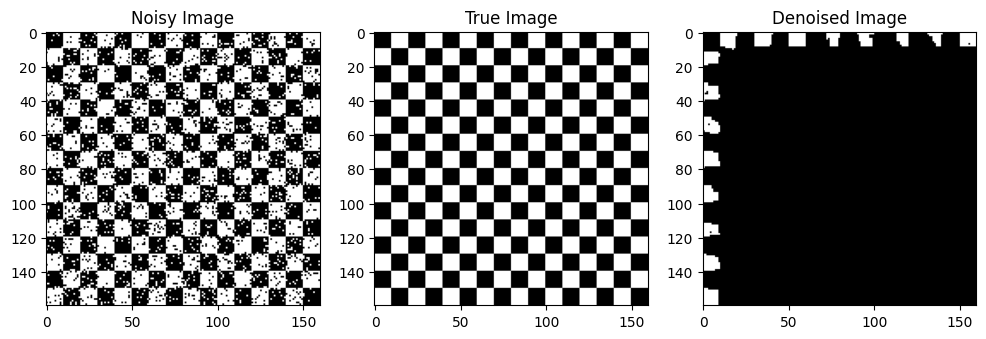

alpha, beta, gamma 1 10 0.1
Accuracy: 0.5467578125


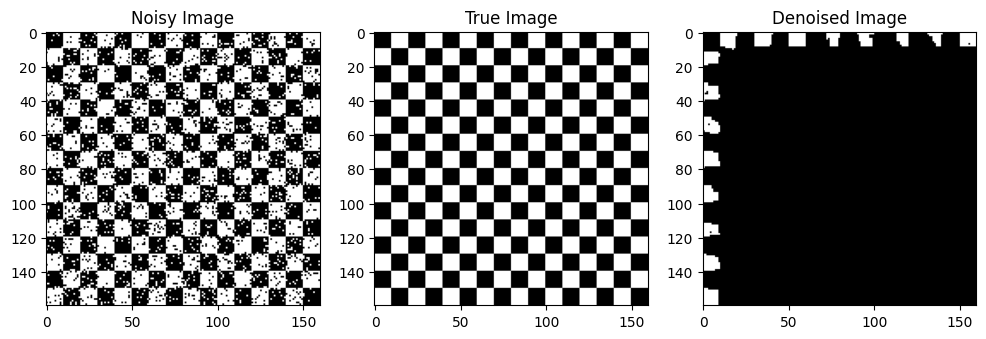

alpha, beta, gamma 1 10 1
Accuracy: 0.9799609375


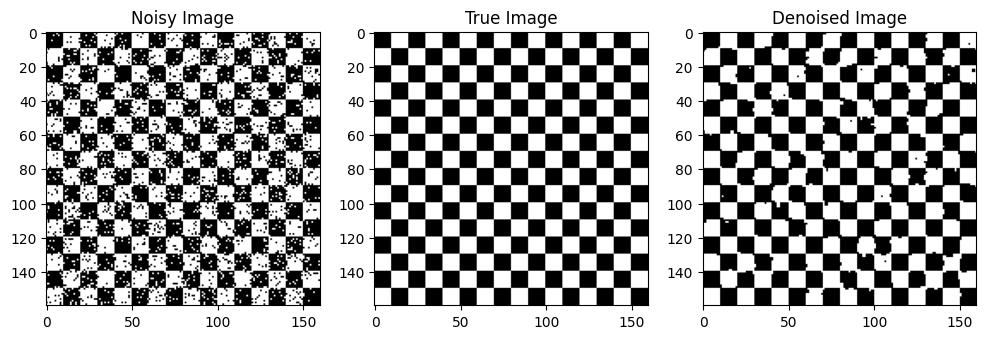

alpha, beta, gamma 1 10 10
Accuracy: 0.9799609375


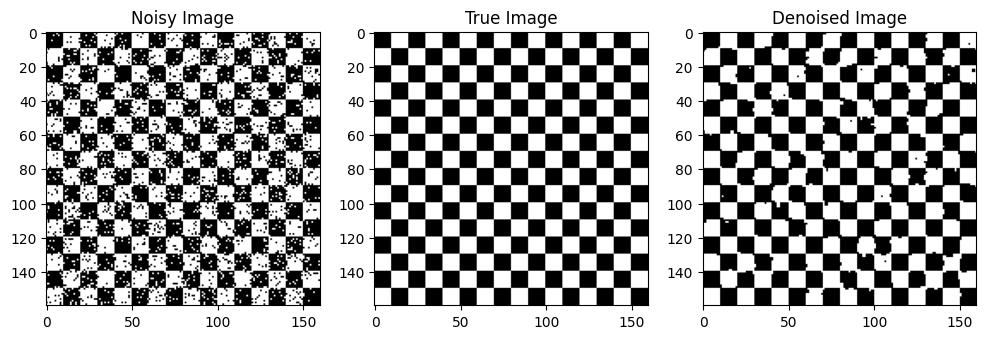

alpha, beta, gamma 1 10 100
Accuracy: 0.9371875


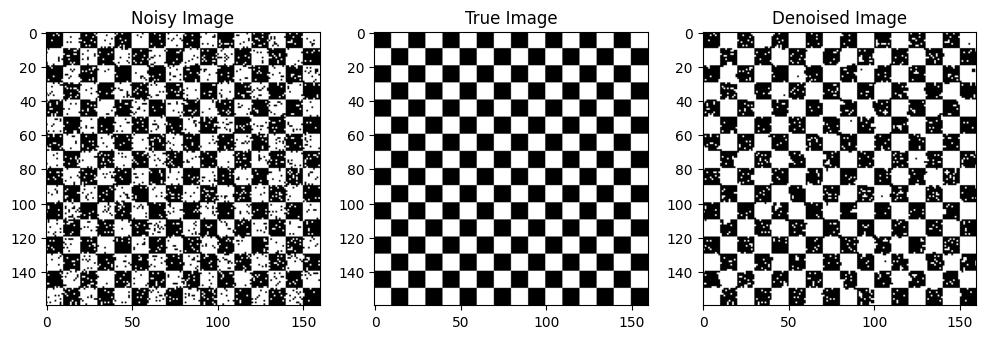

alpha, beta, gamma 1 100 0.01
Accuracy: 0.5467578125


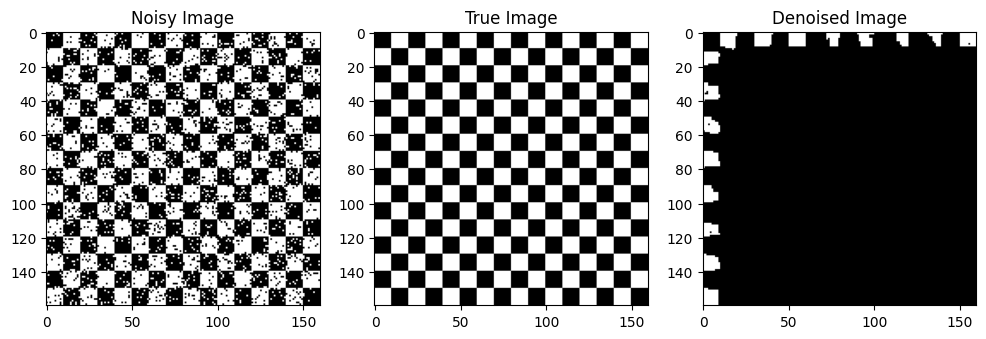

alpha, beta, gamma 1 100 0.1
Accuracy: 0.5467578125


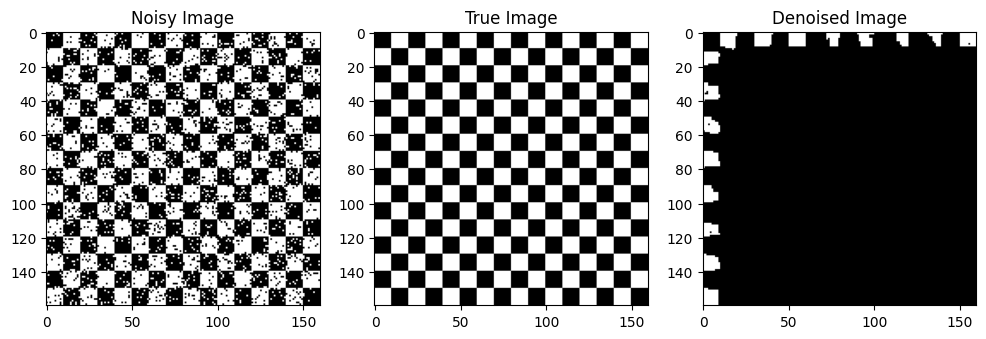

alpha, beta, gamma 1 100 1
Accuracy: 0.9799609375


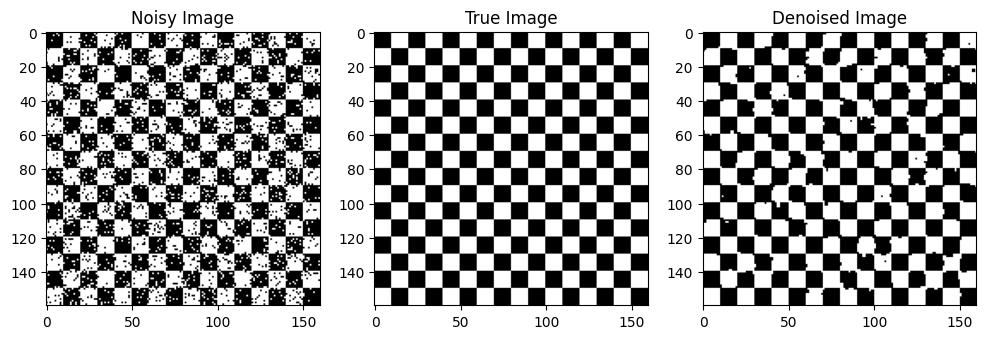

alpha, beta, gamma 1 100 10
Accuracy: 0.9799609375


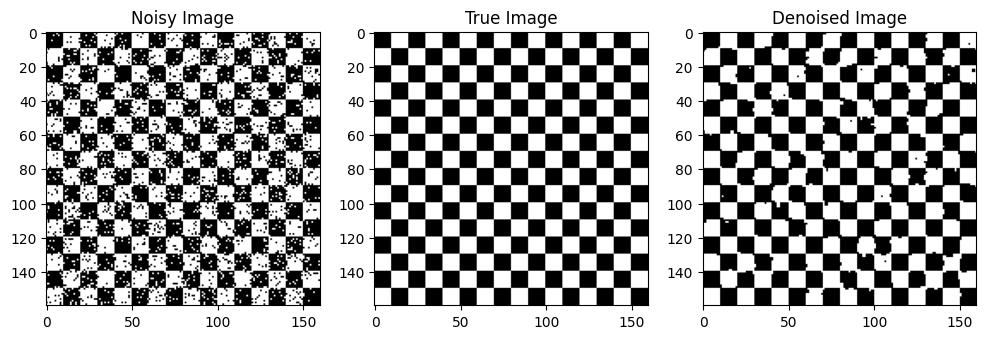

alpha, beta, gamma 1 100 100
Accuracy: 0.9799609375


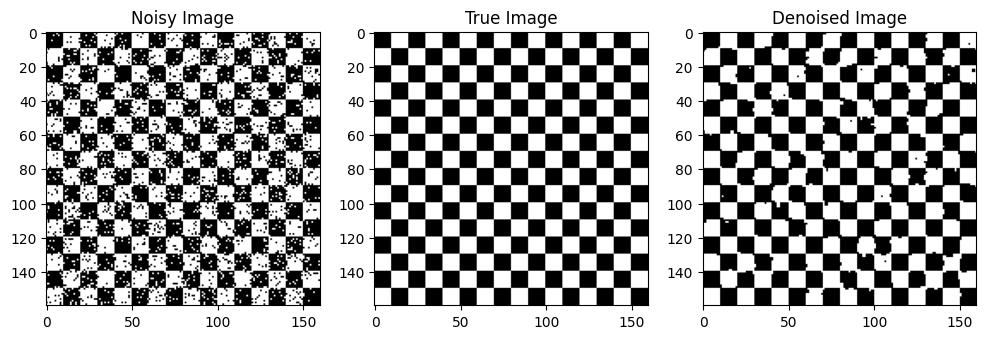

alpha, beta, gamma 10 0.01 0.01
Accuracy: 0.5


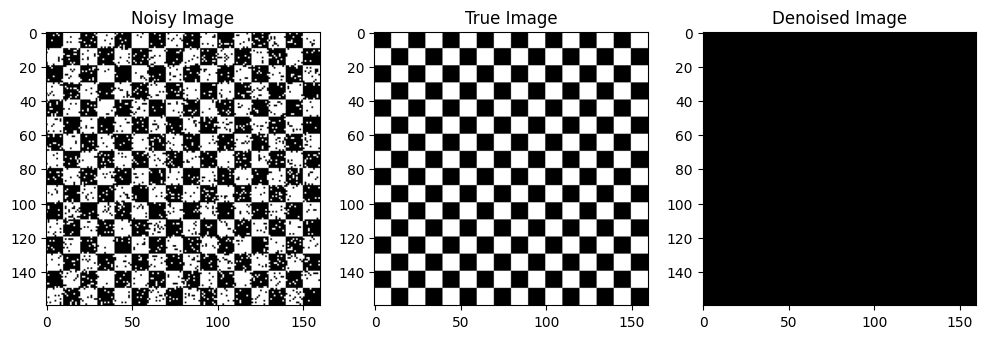

alpha, beta, gamma 10 0.01 0.1
Accuracy: 0.5


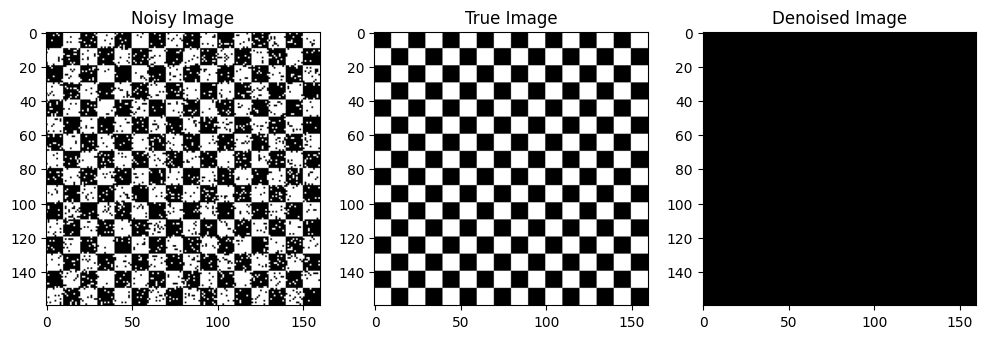

alpha, beta, gamma 10 0.01 1
Accuracy: 0.5


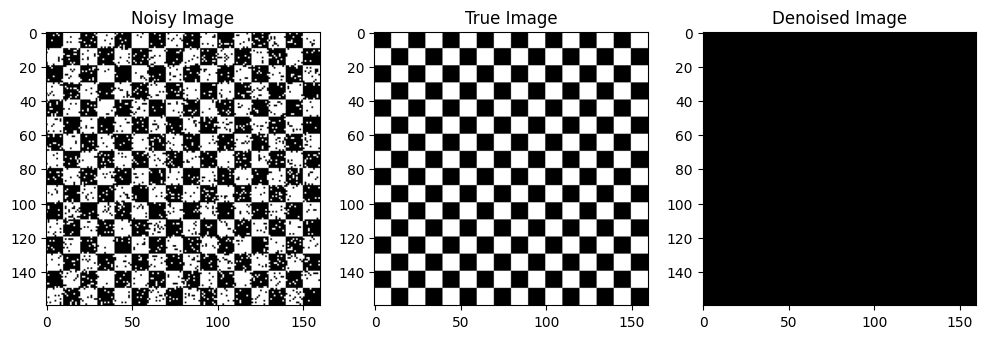

alpha, beta, gamma 10 0.01 10
Accuracy: 0.9385546875


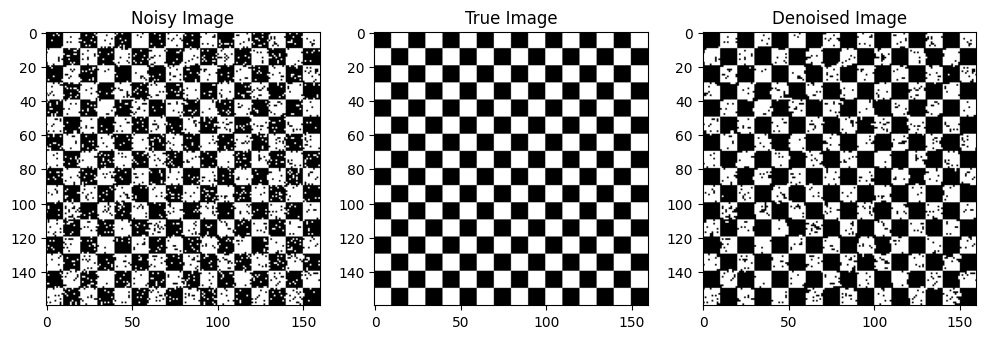

alpha, beta, gamma 10 0.01 100
Accuracy: 0.901875


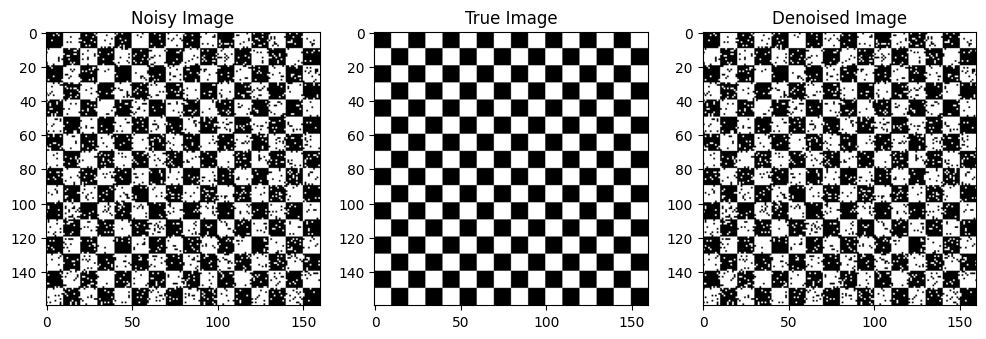

alpha, beta, gamma 10 0.1 0.01
Accuracy: 0.5


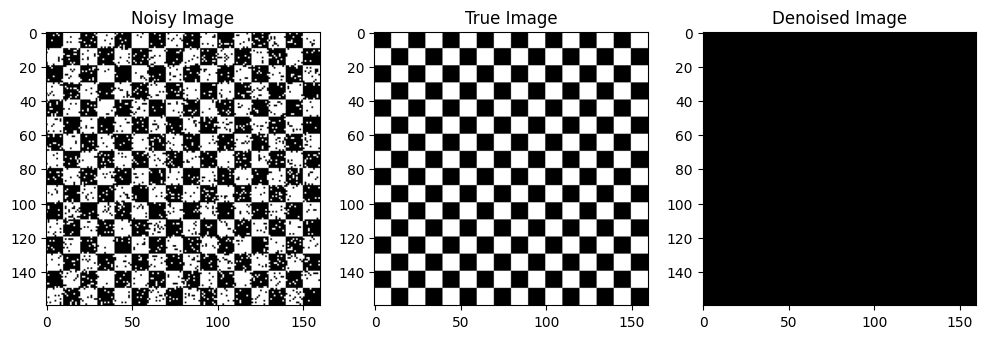

alpha, beta, gamma 10 0.1 0.1
Accuracy: 0.5


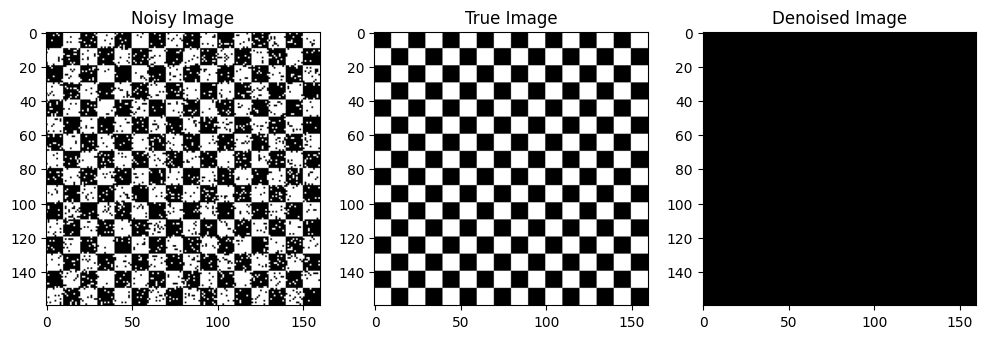

alpha, beta, gamma 10 0.1 1
Accuracy: 0.5


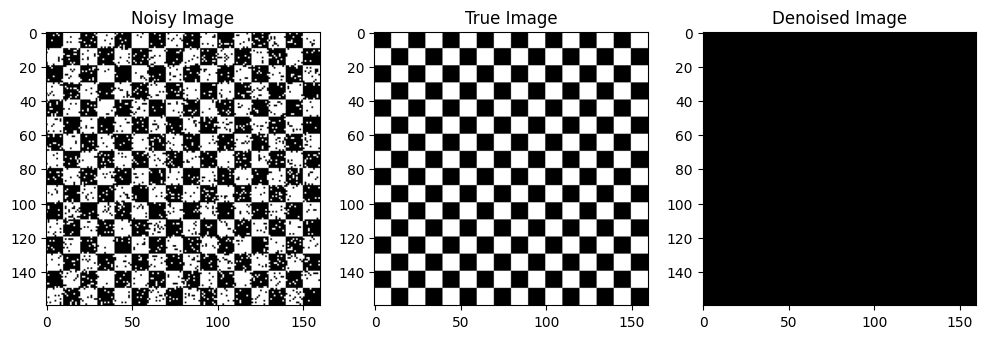

alpha, beta, gamma 10 0.1 10
Accuracy: 0.9385546875


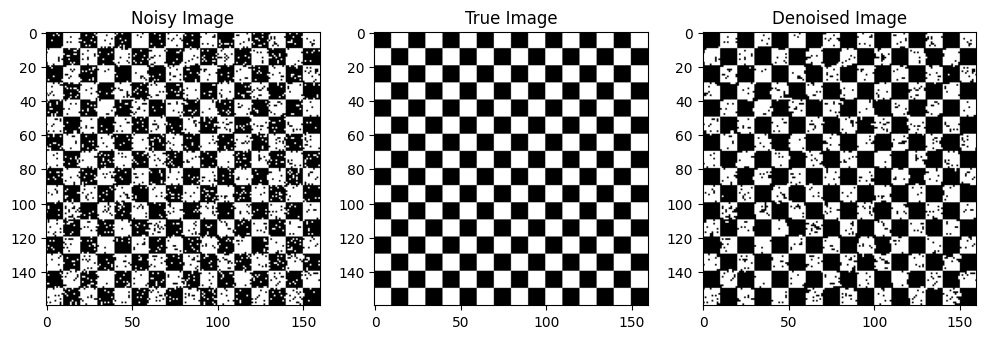

alpha, beta, gamma 10 0.1 100
Accuracy: 0.901875


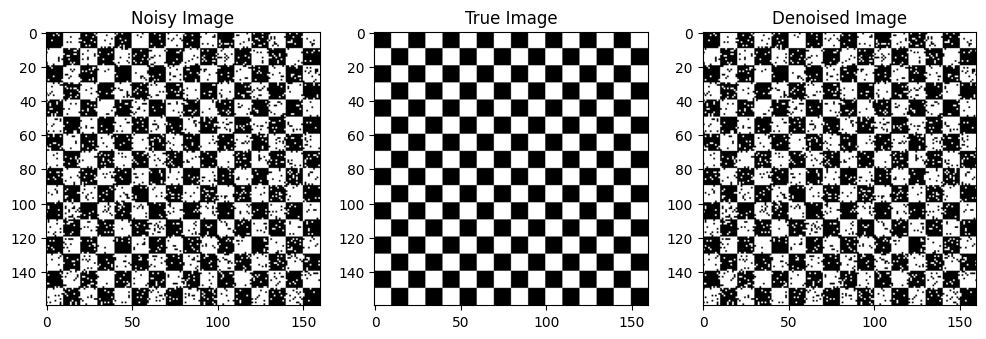

alpha, beta, gamma 10 1 0.01
Accuracy: 0.5


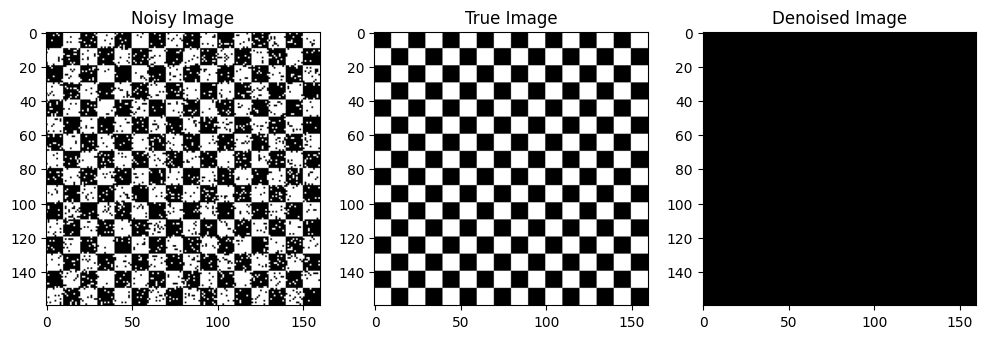

alpha, beta, gamma 10 1 0.1
Accuracy: 0.5


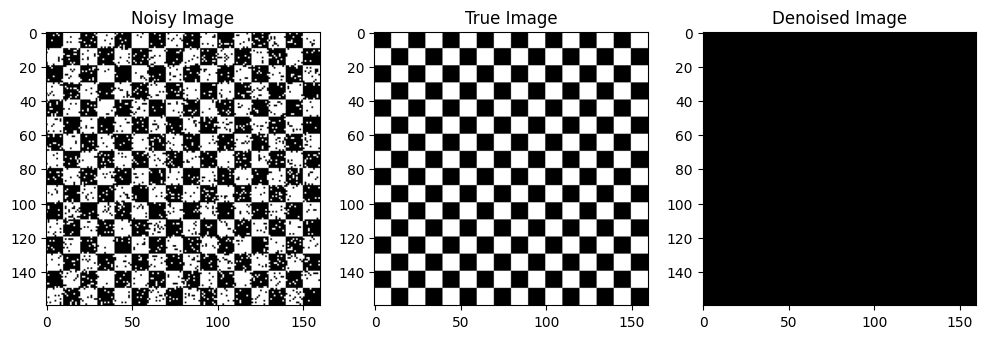

alpha, beta, gamma 10 1 1
Accuracy: 0.5


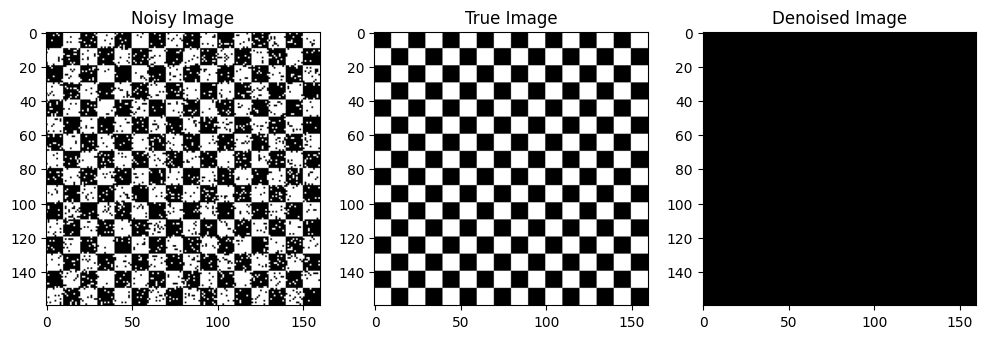

alpha, beta, gamma 10 1 10
Accuracy: 0.9385546875


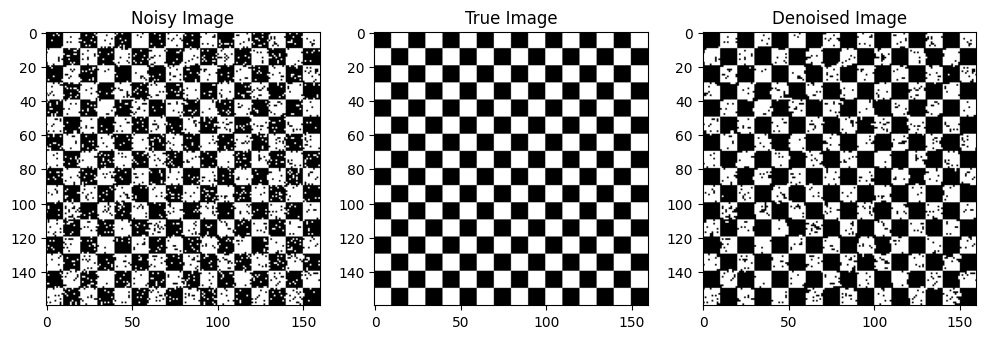

alpha, beta, gamma 10 1 100
Accuracy: 0.901875


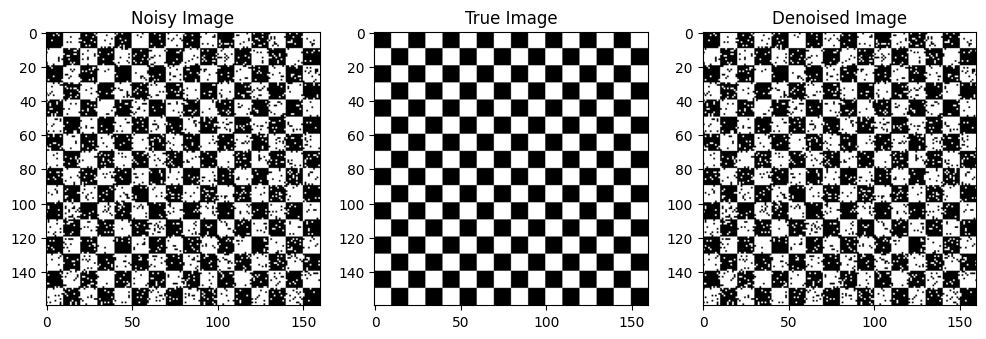

alpha, beta, gamma 10 10 0.01
Accuracy: 0.5453125


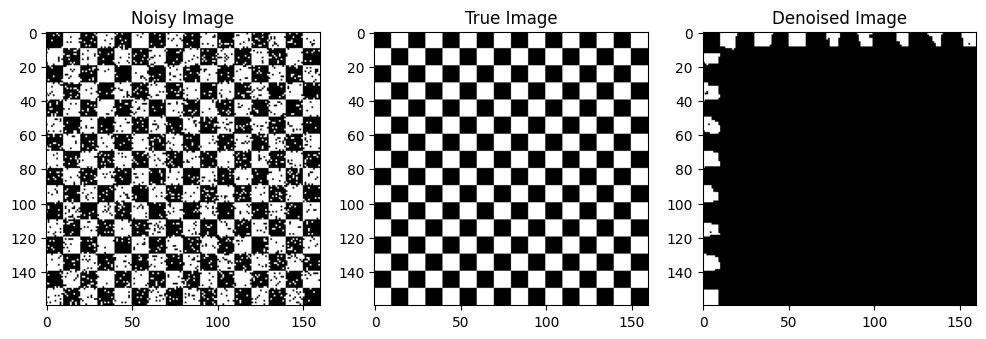

alpha, beta, gamma 10 10 0.1
Accuracy: 0.5453125


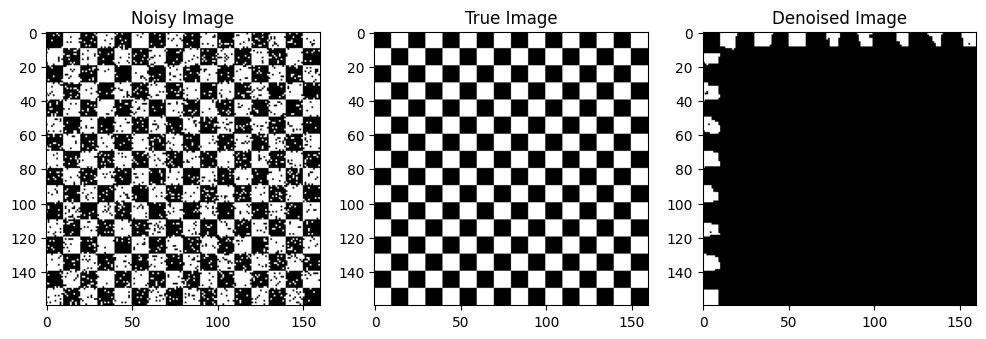

alpha, beta, gamma 10 10 1
Accuracy: 0.5453125


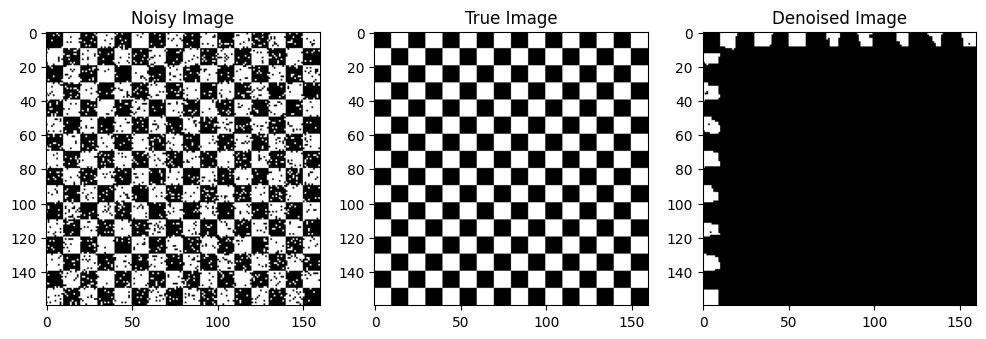

alpha, beta, gamma 10 10 10
Accuracy: 0.9797265625


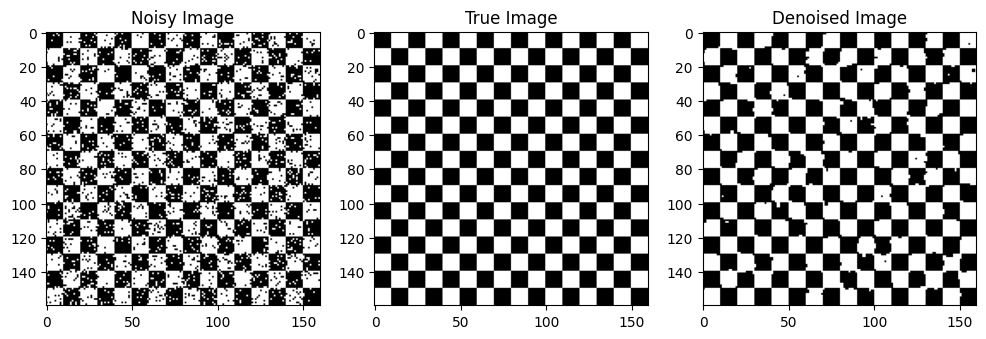

alpha, beta, gamma 10 10 100
Accuracy: 0.937265625


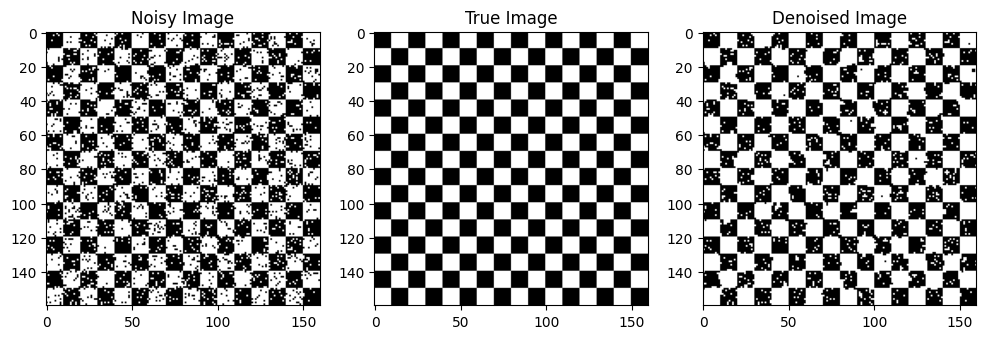

alpha, beta, gamma 10 100 0.01
Accuracy: 0.5467578125


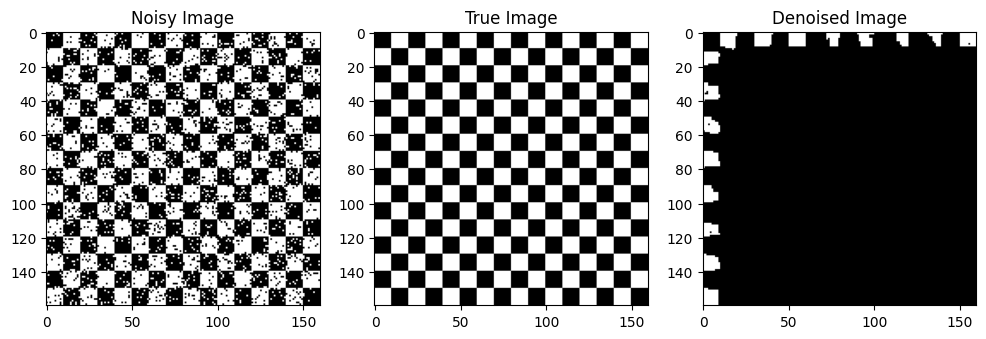

alpha, beta, gamma 10 100 0.1
Accuracy: 0.5467578125


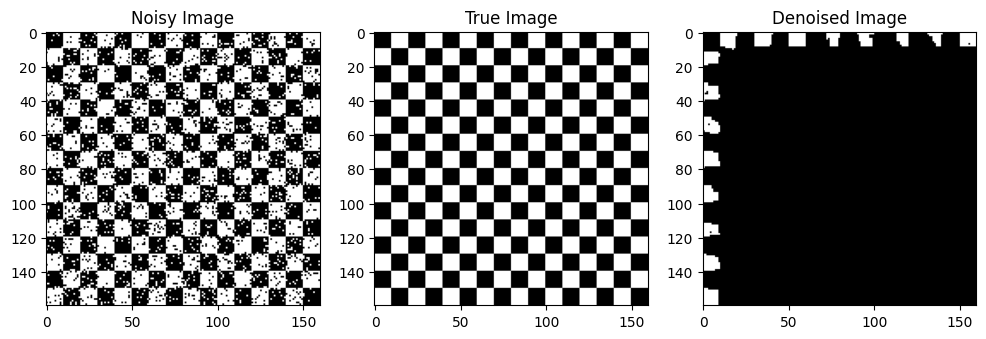

alpha, beta, gamma 10 100 1
Accuracy: 0.5467578125


In [ ]:
from itertools import product

values = [0.01, 0.1, 1, 10, 100]

# for alpha_value in values:
#     for beta_value in values:
#         for gamma_value in values:
for alpha_value, beta_value, gamma_value in product(values, repeat=3):
    run(alpha_value, beta_value, gamma_value)

Accuracy: 0.9797265625


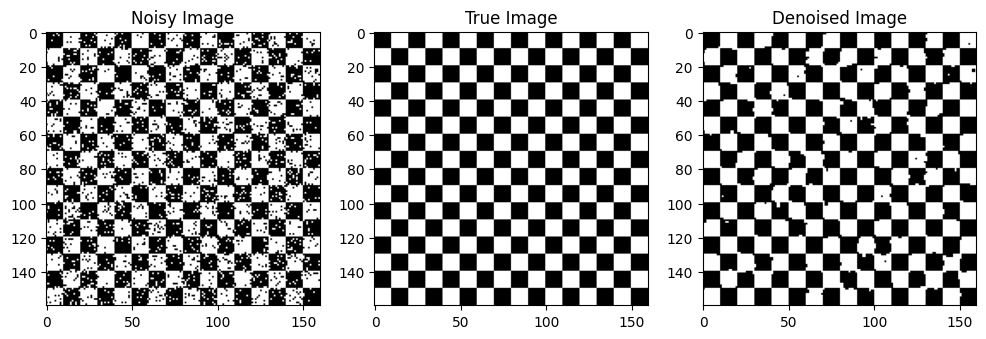

In [84]:
# Initialize the Markov Random Field Denoising with the image file
mrf_denoising = MarkovRandomFieldDenoising('HW1_image.mat', 1, 1, 1)
# Denoise the image
denoised_image = mrf_denoising.denoise_image()

# Compute the accuracy
accuracy = mrf_denoising.compute_accuracy(denoised_image)
print(f"Accuracy: {accuracy}")

# Plot the images
mrf_denoising.plot_images(denoised_image)

# TODO: Discuss the effect of parameter changes and demonstrate with one parameter

Accuracy: 0.9371875


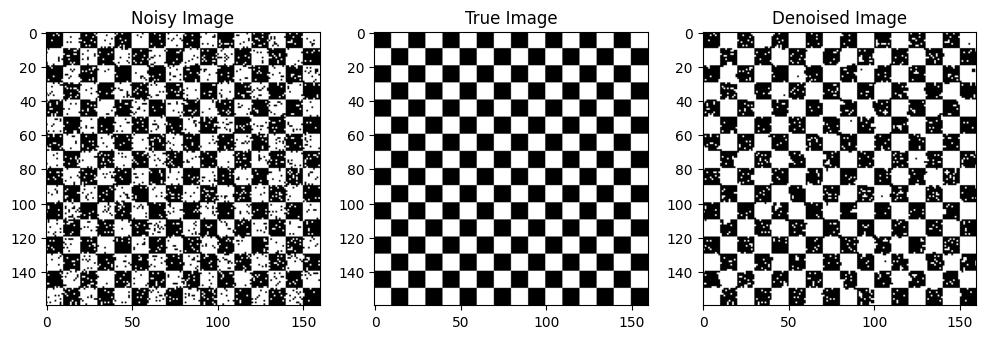

In [85]:
# Initialize the Markov Random Field Denoising with the image file
mrf_denoising = MarkovRandomFieldDenoising('HW1_image.mat', 1, 10, 100)
# Denoise the image
denoised_image = mrf_denoising.denoise_image()

# Compute the accuracy
accuracy = mrf_denoising.compute_accuracy(denoised_image)
print(f"Accuracy: {accuracy}")

# Plot the images
mrf_denoising.plot_images(denoised_image)

# TODO: Discuss the effect of parameter changes and demonstrate with one parameter

Accuracy: 0.9799609375


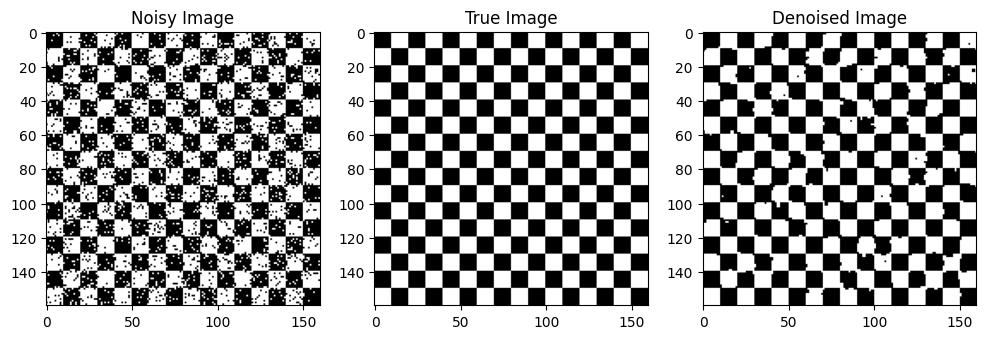

In [103]:
# Initialize the Markov Random Field Denoising with the image file
mrf_denoising = MarkovRandomFieldDenoising('HW1_image.mat', 0.1, 100, 1)
# Denoise the image
denoised_image = mrf_denoising.denoise_image()

# Compute the accuracy
accuracy = mrf_denoising.compute_accuracy(denoised_image)
print(f"Accuracy: {accuracy}")

# Plot the images
mrf_denoising.plot_images(denoised_image)

# TODO: Discuss the effect of parameter changes and demonstrate with one parameter